## Telecom Churn Case Study - Josyula Pratyusha & Neelima Bhavanasi

## Business Problem:
- In the telecom industry, customers are able to choose from multiple service providers and
  actively switch from one operator to another. In this highly competitive market, the
  telecommunications industry experiences an average of 15-25% annual churn rate. Given the
  fact that it costs 5-10 times more to acquire a new customer than to retain an existing
  one, customer retention has now become even more important than customer acquisition.
- For many incumbent operators, retaining high profitable customers is the number one
  business goal.
- To reduce customer churn, telecom companies need to predict which customers are at high
  risk of churn, identify the main indicators of churn and take the corrective steps to reduce the churn. 

### Steps:
1. Loading the File
2. Exploring and understanding the dataset
3. Data Cleaning
4. Finding out the High Values Customers
5. EDA
6. Outlier Treatment
7. Train Test Split
8. Scaling the Data
9. Applying PCA
10. Logistic Regression Using PCA
11. Decision Trees Using PCA
12. Random Forests Using PCA
13. SVM using PCA.
14. Random Forest for Feature Selection.

In [1]:
# Importing all required basic packages
import numpy as np
import pandas as pd
from datetime import date
import re
import sys
import itertools
from IPython.display import Markdown, display ,HTML

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Importing sklearn modules
from sklearn.experimental import enable_iterative_imputer 
from sklearn.impute import IterativeImputer
from sklearn.decomposition import PCA, IncrementalPCA
from sklearn.model_selection import KFold, GridSearchCV,train_test_split,cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, precision_recall_curve, auc, roc_auc_score, roc_curve, recall_score, classification_report
from sklearn.metrics import recall_score,precision_score,roc_auc_score,f1_score,accuracy_score,confusion_matrix

# Importing packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO 

from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [3]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy import stats
from imblearn.over_sampling import SMOTE

In [4]:
# For display of all rows and columns
pd.set_option("display.max_columns", 300)
pd.set_option("display.max_rows", 300)

#### Loading the data file

In [5]:
# Loading the House Pricing dataset
Telecom_df=pd.read_csv("telecom_churn_data.csv")
Telecom_df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

#### Exploring the Telecom Churn Data Set

In [6]:
# Printing the size, number of rows and number of columns in the Telecom churn dataset
print("Size of the Telecom churn dataset: ",Telecom_df.shape)
print("No of rowns in Telecom churn dataset: ",Telecom_df.shape[0])
print("No of columns in Telecom churn dataset: ",Telecom_df.shape[1])

Size of the Telecom churn dataset:  (99999, 226)
No of rowns in Telecom churn dataset:  99999
No of columns in Telecom churn dataset:  226


In [7]:
# Info of the dataset
Telecom_df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Data columns (total 226 columns):
mobile_number               int64
circle_id                   int64
loc_og_t2o_mou              float64
std_og_t2o_mou              float64
loc_ic_t2o_mou              float64
last_date_of_month_6        object
last_date_of_month_7        object
last_date_of_month_8        object
last_date_of_month_9        object
arpu_6                      float64
arpu_7                      float64
arpu_8                      float64
arpu_9                      float64
onnet_mou_6                 float64
onnet_mou_7                 float64
onnet_mou_8                 float64
onnet_mou_9                 float64
offnet_mou_6                float64
offnet_mou_7                float64
offnet_mou_8                float64
offnet_mou_9                float64
roam_ic_mou_6               float64
roam_ic_mou_7               float64
roam_ic_mou_8               float64
roam_ic_mou_9               float6

In [8]:
# Printing the datatypes of the columns present in the Telecom churn dataset
Telecom_df.dtypes

mobile_number                 int64
circle_id                     int64
loc_og_t2o_mou              float64
std_og_t2o_mou              float64
loc_ic_t2o_mou              float64
last_date_of_month_6         object
last_date_of_month_7         object
last_date_of_month_8         object
last_date_of_month_9         object
arpu_6                      float64
arpu_7                      float64
arpu_8                      float64
arpu_9                      float64
onnet_mou_6                 float64
onnet_mou_7                 float64
onnet_mou_8                 float64
onnet_mou_9                 float64
offnet_mou_6                float64
offnet_mou_7                float64
offnet_mou_8                float64
offnet_mou_9                float64
roam_ic_mou_6               float64
roam_ic_mou_7               float64
roam_ic_mou_8               float64
roam_ic_mou_9               float64
roam_og_mou_6               float64
roam_og_mou_7               float64
roam_og_mou_8               

In [9]:
# Describing the Telecom churn dataset for the numerical columns
Telecom_df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621

### Telecom churn dataset  Analysing and Cleaning

In [10]:
# Checking for duplicate rows
Telecom_df[Telecom_df.duplicated()]

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g


No duplicate rows in the dataset

In [11]:
# Dropping the variables with same values in the columns
Telecom_df = Telecom_df.loc[:,Telecom_df.apply(pd.Series.nunique) != 1]
print("The shape of the dataframe after dropping columns with unique values : ",Telecom_df.shape)

The shape of the dataframe after dropping columns with unique values :  (99999, 210)


#### Few columns are named with naming conventions of jun,jul,aug,sep while most of the columns have month numbers as naming conventions. Bringing all columns with same naming convention

In [12]:
Telecom_df.rename(columns={'jun_vbc_3g': 'vbc_3g_6','jul_vbc_3g': 'vbc_3g_7','aug_vbc_3g': 'vbc_3g_8','sep_vbc_3g': 'vbc_3g_9'}, inplace=True)

In [13]:
# Missing percentage values of the columns in the dataset
missing_count=100*(Telecom_df.isnull().sum()/Telecom_df.shape[0])
missing_count=missing_count[missing_count>0]
print("No of columns having missing values: ",len(missing_count))
print(missing_count.sort_values(ascending=False))

No of columns having missing values:  152
count_rech_3g_6             74.846748
fb_user_6                   74.846748
date_of_last_rech_data_6    74.846748
count_rech_2g_6             74.846748
night_pck_user_6            74.846748
av_rech_amt_data_6          74.846748
total_rech_data_6           74.846748
arpu_2g_6                   74.846748
max_rech_data_6             74.846748
arpu_3g_6                   74.846748
arpu_3g_7                   74.428744
count_rech_3g_7             74.428744
count_rech_2g_7             74.428744
av_rech_amt_data_7          74.428744
max_rech_data_7             74.428744
arpu_2g_7                   74.428744
night_pck_user_7            74.428744
date_of_last_rech_data_7    74.428744
fb_user_7                   74.428744
total_rech_data_7           74.428744
total_rech_data_9           74.077741
count_rech_2g_9             74.077741
max_rech_data_9             74.077741
date_of_last_rech_data_9    74.077741
fb_user_9                   74.077741
count_re

#### Analysing features having same percentage of missing value i.e. 74.846748 , 74.4428744,74.077741and 73.660737 
These are columns for month 6,7,9 and 8 months respectively
The last recharge data is not there and therefore all related columns are also missing so imputing them with 0

In [14]:
# Inspecting the columns by storing them into a variable
col=['count_rech_3g_6','fb_user_6','date_of_last_rech_data_6','count_rech_2g_6','night_pck_user_6','av_rech_amt_data_6','total_rech_data_6','arpu_2g_6','max_rech_data_6','arpu_3g_6']
Telecom_df[col].describe([0])

,count_rech_3g_6,fb_user_6,count_rech_2g_6,night_pck_user_6,av_rech_amt_data_6,total_rech_data_6,arpu_2g_6,max_rech_data_6,arpu_3g_6
count,25153.000000,25153.000000,25153.000000,25153.000000,25153.000000,25153.000000,25153.000000,25153.000000,25153.000000
mean,0.599133,0.914404,1.864668,0.025086,192.600982,2.463802,86.398003,126.393392,89.555057
std,1.274428,0.279772,2.570254,0.156391,192.646318,2.789128,172.767523,108.477235,193.124653
min,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,-35.830000,1.000000,-30.820000
0%,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,-35.830000,1.000000,-30.820000
50%,0.000000,1.000000,1.000000,0.000000,154.000000,1.000000,10.830000,145.000000,0.480000
max,29.000000,1.000000,42.000000,1.000000,7546.000000,61.000000,6433.760000,1555.000000,6362.280000


In [15]:
# Taking all the above analysed columns in to a variable to impute null values with 0.
col=['count_rech_3g_6','date_of_last_rech_data_6','count_rech_2g_6','av_rech_amt_data_6','total_rech_data_6','arpu_2g_6','max_rech_data_6','arpu_3g_6']
Telecom_df[col] = Telecom_df[col].fillna(0)

# Storing categorical variables in another variable and imputing them with '-1' category 
col1=['fb_user_6','night_pck_user_6']
Telecom_df[col1] = Telecom_df[col1].fillna(-1)

In [16]:
# Taking all the above analysed columns in to a variable to impute null values with 0.
col=['count_rech_3g_7','date_of_last_rech_data_7','count_rech_2g_7','av_rech_amt_data_7','total_rech_data_7','arpu_2g_7','max_rech_data_7','arpu_3g_7']
Telecom_df[col] = Telecom_df[col].fillna(0)

# Storing categorical variables in another variable and imputing them with '-1' .
col1=['fb_user_7','night_pck_user_7']
Telecom_df[col1] = Telecom_df[col1].fillna(-1)

In [17]:
# Taking all the above analysed columns in to a variable to impute null values with 0.
col=['count_rech_3g_8','date_of_last_rech_data_8','count_rech_2g_8','av_rech_amt_data_8','total_rech_data_8','arpu_2g_8','max_rech_data_8','arpu_3g_8']
Telecom_df[col] = Telecom_df[col].fillna(0)

# Storing categorical variables in another variable and imputing them with '-1' 
col1=['fb_user_8','night_pck_user_8']
Telecom_df[col1] = Telecom_df[col1].fillna(-1)

In [18]:
# Taking all the above analysed columns in to a variable to impute null values with 0.
col=['count_rech_3g_9','date_of_last_rech_data_9','count_rech_2g_9','av_rech_amt_data_9','total_rech_data_9','arpu_2g_9','max_rech_data_9','arpu_3g_9']
Telecom_df[col] = Telecom_df[col].fillna(0)

# Storing categorical variables in another variable and imputing them with '-1' 
col1=['fb_user_9','night_pck_user_9']
Telecom_df[col1] = Telecom_df[col1].fillna(-1)

In [19]:
# All Category columns 
cat_cols=['fb_user_6','night_pck_user_6','fb_user_7','night_pck_user_7','fb_user_8','night_pck_user_8','fb_user_9','night_pck_user_9']

In [20]:
 # All date related columns into a variable
Date_columns=Telecom_df.columns[Telecom_df.columns.str.contains(pat = 'date')]
Telecom_df[Date_columns].head()    

,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9
0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,6/21/2014,7/16/2014,8/8/2014,0
1,6/29/2014,7/31/2014,8/28/2014,9/30/2014,0,7/25/2014,8/10/2014,0
2,6/17/2014,7/24/2014,8/14/2014,9/29/2014,0,0,0,9/17/2014
3,6/28/2014,7/31/2014,8/31/2014,9/30/2014,0,0,0,0
4,6/26/2014,7/28/2014,8/9/2014,9/28/2014,6/4/2014,0,0,0


In [21]:
# Dropping date columns as they are of not much use in analysis
Telecom_df.drop(Date_columns,axis=1,inplace=True)

In [22]:
# Dropping all cat cols 
Telecom_df.drop(cat_cols,axis=1,inplace=True)

In [23]:
# Mobile number column can be set as index
Telecom_df.set_index('mobile_number')

,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
mobile_number,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
7000842753,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,4,3,2,6,362,252,252,0,252,252,252,0,252,252,252,0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.00,83.57,150.76,109.61,0.00,212.17,212.17,212.17,0.00,212.17,212.17,212.17,0.00,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.40,0.00,101.20,3.58
7001865778,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.84,304.76,53.76,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.8

In [24]:
# Storing values in a variable as it can be used after Iterative Imputer
df_columns=Telecom_df.columns

# # Defining and fitting Iterative Imputer
imputer = IterativeImputer(max_iter=10,min_value=0, verbose=0,random_state=42)
Telecom_df = imputer.fit_transform(Telecom_df)

In [25]:
# # Storing as a dataframe as these need to be concatenated later
Telecom_df=pd.DataFrame(Telecom_df)
Telecom_df.columns=df_columns

In [26]:
# Checking for missing values after iterative imputation.
missing_count=100*(Telecom_df.isnull().sum()/Telecom_df.shape[0])
missing_count=missing_count[missing_count>0]
print("No of columns having missing values: ",len(missing_count))
print(missing_count.sort_values(ascending=False))

No of columns having missing values:  0
Series([], dtype: float64)


In [27]:
# Head of the dataset to inspect values after imputation
Telecom_df.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
0,7.000843e+09,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,141.433909,157.389481,0.00,139.186778,25.405712,19.913848,0.00,19.087339,14.738887,6.062548,0.00,5.270992,45.26311,27.939687,0.00,46.660168,93.34225,91.393563,0.00,90.452374,3.753334,3.801267,0.00,3.663815,0.0,0.00,0.00,0.00,10.102625,0.00,0.00,0.00,94.695111,93.404881,0.00,99.729317,87.361985,90.802683,0.00,86.197886,1.093781,1.147202,0.00,1.069302,122.033603,123.363954,0.00,120.858354,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,63.71781,48.275642,0.16,73.528083,107.482121,107.116539,4.13,106.155408,12.076571,12.604581,1.15,12.17147,76.751052,68.452687,5.44,79.5326,31.814962,26.010865,0.00,37.661662,20.721069,21.64772,0.00,19.617604,2.157223,2.223094,0.00,2.1763,3.498386,3.18897,0.00,4.114362,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4.0,3.0,2.0,6.0,362.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,0.00,212.17,212.17,212.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0

In [28]:
# Fetching all 6,7,8 month columns for analysation
columns_6 = Telecom_df.columns[Telecom_df.columns.str.contains(pat = '6')]
columns_7 = Telecom_df.columns[Telecom_df.columns.str.contains(pat = '7')]
columns_8 = Telecom_df.columns[Telecom_df.columns.str.contains(pat = '8')]

In [29]:
# Analysing the details of out going mou related columns first
columns_6_mou  = Telecom_df[columns_6].columns[Telecom_df[columns_6].columns.str.contains(pat = 'mou')]
columns_6_mou_og  = Telecom_df[columns_6].columns[Telecom_df[columns_6].columns.str.contains(pat = 'og')]
Telecom_df[columns_6_mou_og].head(100)   

,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,og_others_6,total_og_mou_6
0,14.738887,45.263110,93.342250,3.753334,0.00,10.102625,94.695111,87.361985,1.093781,122.033603,0.00,0.00,0.00,0.00
1,0.000000,23.880000,11.510000,0.000000,0.00,35.390000,0.230000,0.000000,0.000000,0.230000,0.00,4.68,0.00,40.31
2,0.000000,7.190000,29.340000,24.110000,0.00,60.660000,4.340000,41.810000,1.480000,47.640000,0.00,46.56,0.45,155.33
3,0.000000,73.680000,107.430000,1.910000,0.00,183.030000,26.230000,2.990000,0.000000,29.230000,0.00,10.96,0.00,223.23
4,0.000000,50.310000,67.640000,0.000000,0.00,117.960000,0.000000,9.310000,0.000000,9.310000,0.00,0.00,0.00,127.28
5,0.000000,50.160000,16.390000,0.000000,0.00,66.560000,0.000000,0.000000,2.880000,2.880000,0.00,0.00,0.00,69.44
6,0.000000,71.030000,252.230000,10.380000,0.11,333.640000,0.000000,0.000000,0.000000,0.000000,0.00,0.11,0.00,333.76
7,23.740000,51.390000,308.630000,62.130000,0.00,422.160000,4.300000,49.890000,6.660000,60.860000,0.00,4.50,0.00,487.53
8,0.000000,297.130000,80.960000,0.000000,0.00,378.090000,116.560000,13.690000,0.000000,130.260000,0.00,0.00,0.00,508.36
9,0.000000,33.890000,38.030000,0.000000,0.00,71.930000,0.000000,25.450000,0.000000,25.450000,0.00,0.66,0.00,98.04


From the above what is understood is the sum of 'loc_og_mou_6','std_og_mou_6','isd_og_mou_6'and 'spl_og_mou_6' add up to 'total_og_mou_6'

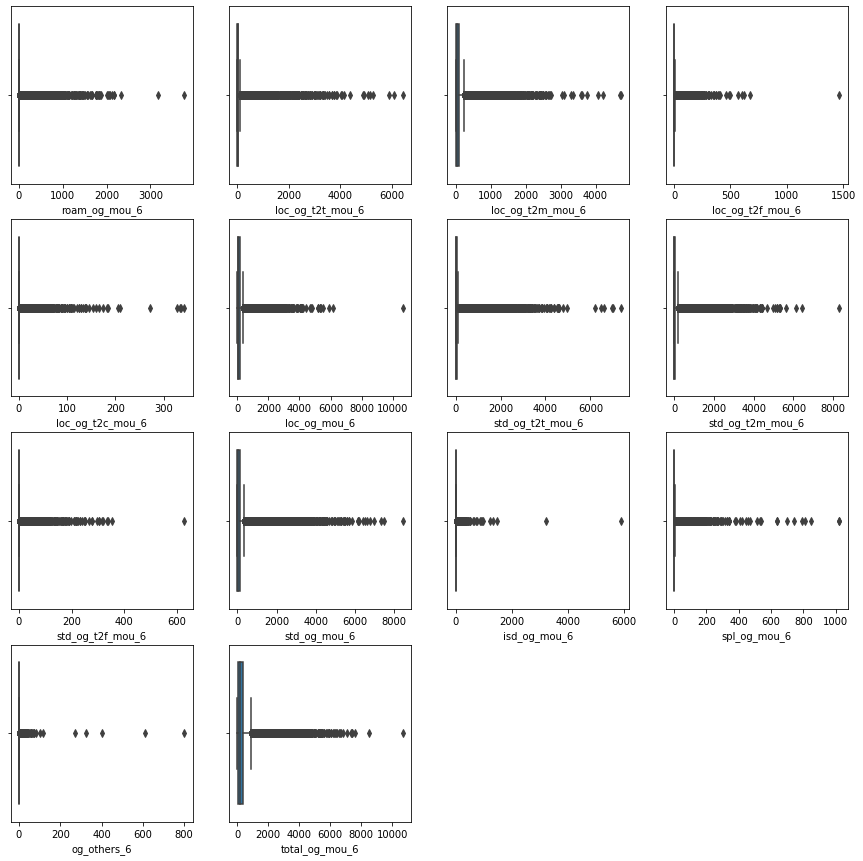

In [30]:
# Plotting boxplot to check the outliers in the features
plt.figure(figsize=(15,15))
for i,j in enumerate(columns_6_mou_og):
    plt.subplot(4,4,i+1)
    sns.boxplot(Telecom_df[j])
plt.show()

Outliers are present in almost all the features and treating outliers can be done after deriving all the variables and dropping unnecessary columns

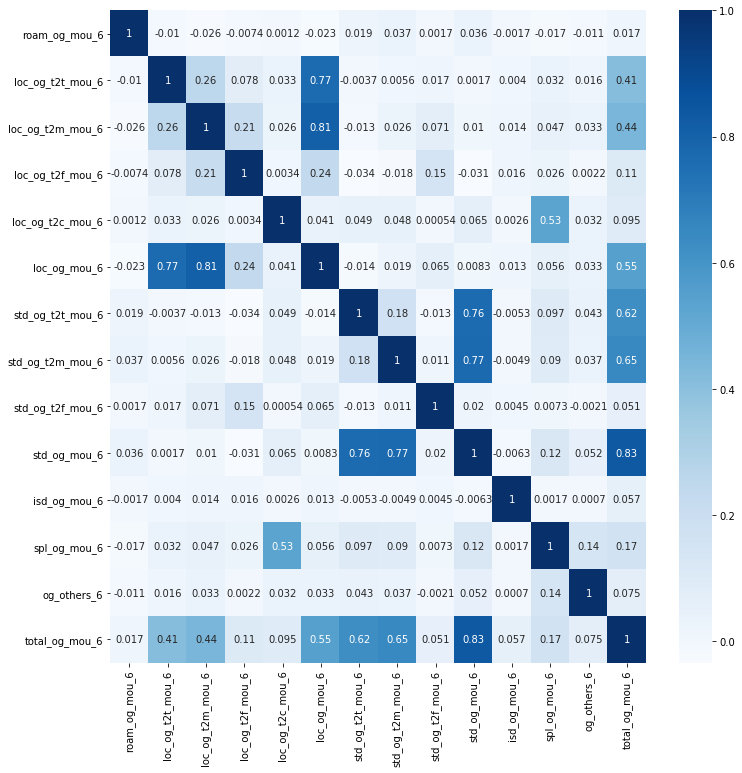

In [31]:
# Heatmap of all outgoing mou columns of 6th month
plt.figure(figsize=(12,12))
sns.heatmap(Telecom_df[columns_6_mou_og].corr(),cmap="Blues",annot=True)
plt.show()

'loc_og_mou_6', 'std_og_mou_6', 'spl_og_mou_6' and 'total_og_mou_6' are highly correlated with other features so can drop them

In [32]:
# Variables that need to be dropped
dropping_var=['loc_og_mou_6','std_og_mou_6','spl_og_mou_6','total_og_mou_6']

In [33]:
# Fetching all icoming mou of 6 month columns
columns_6_mou_ic  = Telecom_df[columns_6].columns[Telecom_df[columns_6].columns.str.contains(pat = 'ic')]
Telecom_df[columns_6_mou_ic].head(5) 

,roam_ic_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_mou_6,total_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6,ic_others_6
0,25.405712,63.71781,107.482121,12.076571,76.751052,31.814962,20.721069,2.157223,3.498386,0.00,0.00,0.00,0.00
1,0.000000,1.61000,17.480000,0.000000,19.090000,0.000000,5.900000,0.000000,5.900000,26.83,0.00,1.83,0.00
2,0.000000,115.69000,14.380000,99.480000,229.560000,72.410000,45.180000,21.730000,139.330000,370.04,0.21,0.00,0.93
3,0.000000,62.08000,113.960000,57.430000,233.480000,43.480000,1.330000,1.180000,45.990000,280.08,0.59,0.00,0.00
4,0.000000,105.68000,106.840000,1.500000,214.030000,0.000000,1.930000,0.000000,1.930000,216.44,0.00,0.00,0.48


loc_ic_mou_6,std_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6 add upto total_ic_mou_6

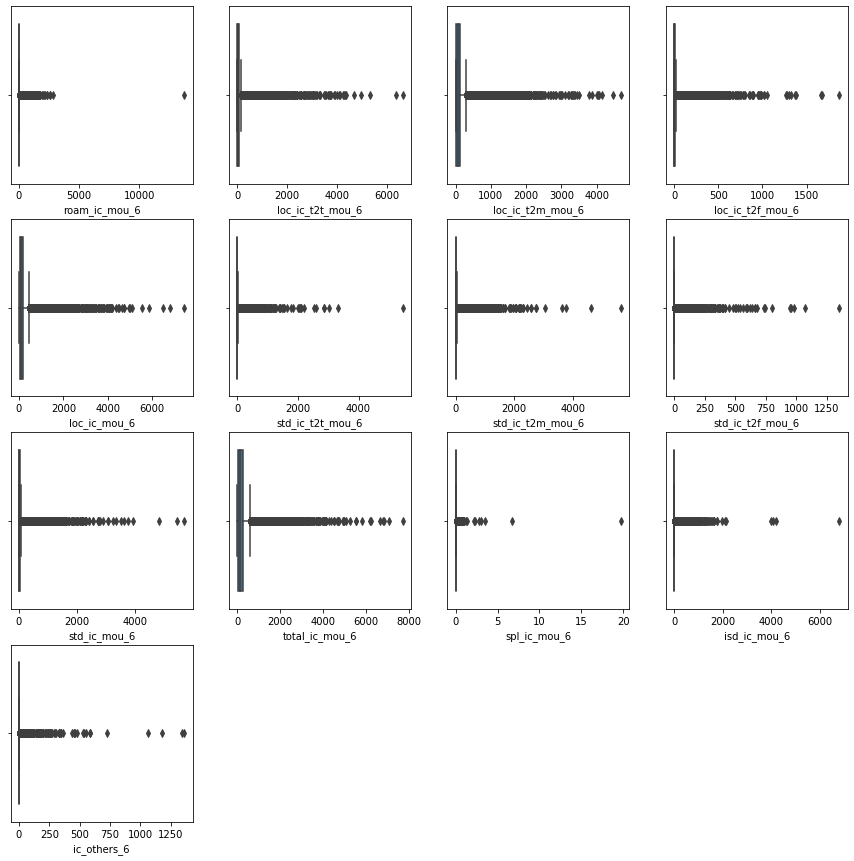

In [34]:
# Plotting boxplot to check for the outliers
plt.figure(figsize=(15,15))
for i,j in enumerate(columns_6_mou_ic):
    plt.subplot(4,4,i+1)
    sns.boxplot(Telecom_df[j])
plt.show()

Outliers are present in almost all the features and treating outliers can be done after deriving all the variables and dropping unnecessary columns

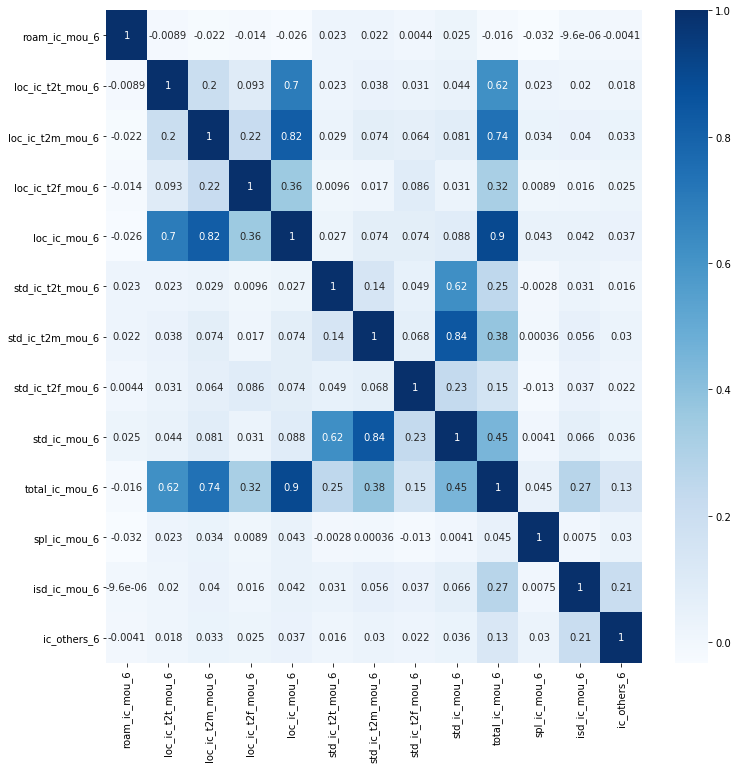

In [35]:
#Heatmap of incoming mou of 6th monyh columns
plt.figure(figsize=(12,12))
sns.heatmap(Telecom_df[columns_6_mou_ic].corr(),cmap="Blues",annot=True)
plt.show()

loc_ic_mou_6, std_ic_mou_6 and 'total_ic_mou_6' are correlated with other variables and can be dropped

In [36]:
# Analysing the details of recharge related columns first
columns_6_rech  = Telecom_df[columns_6].columns[Telecom_df[columns_6].columns.str.contains(pat = 'rech|rch')]
Telecom_df[columns_6_rech].head(10)

,total_rech_num_6,total_rech_amt_6,max_rech_amt_6,last_day_rch_amt_6,total_rech_data_6,max_rech_data_6,count_rech_2g_6,count_rech_3g_6,av_rech_amt_data_6
0,4.0,362.0,252.0,252.0,1.0,252.0,0.0,1.0,252.0
1,4.0,74.0,44.0,44.0,0.0,0.0,0.0,0.0,0.0
2,5.0,168.0,86.0,0.0,0.0,0.0,0.0,0.0,0.0
3,10.0,230.0,60.0,30.0,0.0,0.0,0.0,0.0,0.0
4,5.0,196.0,56.0,50.0,1.0,56.0,1.0,0.0,56.0
5,2.0,120.0,120.0,120.0,0.0,0.0,0.0,0.0,0.0
6,15.0,499.0,90.0,37.0,0.0,0.0,0.0,0.0,0.0
7,5.0,1580.0,1580.0,0.0,0.0,0.0,0.0,0.0,0.0
8,19.0,437.0,90.0,50.0,0.0,0.0,0.0,0.0,0.0
9,4.0,220.0,110.0,110.0,0.0,0.0,0.0,0.0,0.0


From above we can understand when is the recharge done and  for how much amount the recharge is done and what is the average recharge data. For our analysation we can concise these to few columns. Date columns can be dropped. Total recharge amount and total recharge data amount are much helpful for revenue calculation, count of recharges and count of recharge data are not of much use but still keeping them.

 - total_rech_data_6 is actually the number of times the data was recharged
   (total recharge data amount can be derived by total_rech_data_6 * av_rech_amt_data_6
 - total_rech_amt_6 is the total amount for the recharge was done.

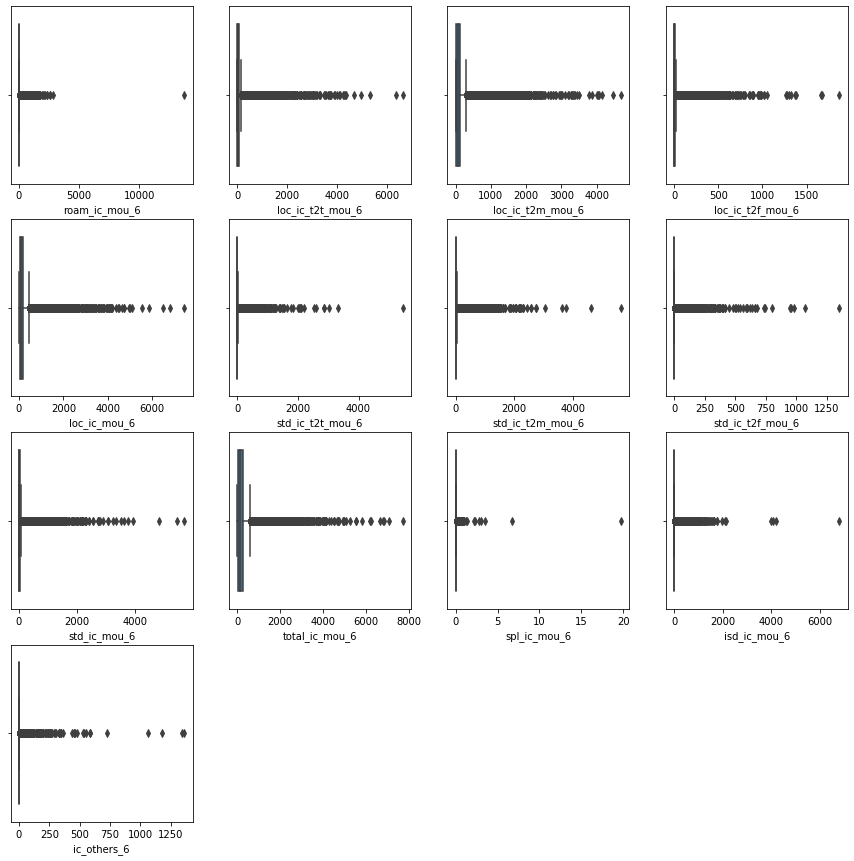

In [37]:
# Plotting boxplot to check for the outliers
plt.figure(figsize=(15,15))
for i,j in enumerate(columns_6_mou_ic):
    plt.subplot(4,4,i+1)
    sns.boxplot(Telecom_df[j])
plt.show()

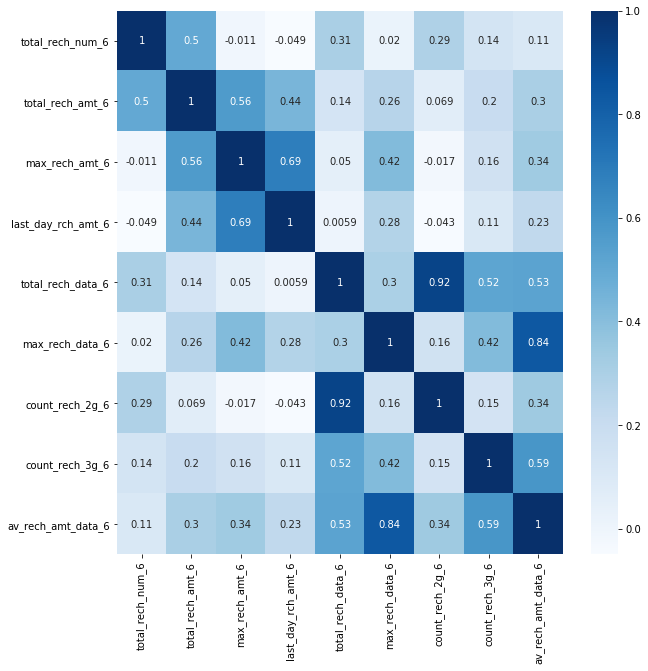

In [38]:
# Heatmap for rechatge related columns to check for the multi collinearity
plt.figure(figsize=(10,10))
sns.heatmap(Telecom_df[columns_6_rech].corr(),cmap="Blues",annot=True)
plt.show()

'max_rech_data_6','last_day_rch_amt_6','total_rech_num_6','total_rech_amt_6','count_rech_2g_6','count_rech_3g_6' are highly correlated variables and can be dropped

In [39]:
# Top 5 rows of the dataframe
Telecom_df.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9
0,7.000843e+09,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,141.433909,157.389481,0.00,139.186778,25.405712,19.913848,0.00,19.087339,14.738887,6.062548,0.00,5.270992,45.26311,27.939687,0.00,46.660168,93.34225,91.393563,0.00,90.452374,3.753334,3.801267,0.00,3.663815,0.0,0.00,0.00,0.00,10.102625,0.00,0.00,0.00,94.695111,93.404881,0.00,99.729317,87.361985,90.802683,0.00,86.197886,1.093781,1.147202,0.00,1.069302,122.033603,123.363954,0.00,120.858354,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,63.71781,48.275642,0.16,73.528083,107.482121,107.116539,4.13,106.155408,12.076571,12.604581,1.15,12.17147,76.751052,68.452687,5.44,79.5326,31.814962,26.010865,0.00,37.661662,20.721069,21.64772,0.00,19.617604,2.157223,2.223094,0.00,2.1763,3.498386,3.18897,0.00,4.114362,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4.0,3.0,2.0,6.0,362.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,212.17,212.17,212.17,0.00,212.17,212.17,212.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0

In [40]:
# Checking the shape after dropping the variables
print('The shape of the dataframe after deleting the columns from the dataset : ',Telecom_df.shape)

The shape of the dataframe after deleting the columns from the dataset :  (99999, 194)


#### Derived metrics for filtering High Value customers

In [41]:
# Since avg = sum of total observations/number of observations
# Sum of total observations = Avg * number of observations
# Here 'total_rech_data_6' is the sum of count of recharge data of 2g and count of recharge data of 3g
Telecom_df['Total_amnt_rech_data_6'] = Telecom_df['total_rech_data_6'] * Telecom_df['av_rech_amt_data_6']
Telecom_df['Total_amnt_rech_data_7'] = Telecom_df['total_rech_data_7'] * Telecom_df['av_rech_amt_data_7']

In [42]:
# Total revenue generated for 6th and 7th months
Telecom_df['Total_amount_6'] = Telecom_df['total_rech_amt_6'] + Telecom_df['Total_amnt_rech_data_6']
Telecom_df['Total_amount_7'] = Telecom_df['total_rech_amt_7'] + Telecom_df['Total_amnt_rech_data_7']

#### Calculating total revenue generated for months 6 and 7 i.e the good phase to calculate high value customers

In [43]:
# Taking average for columns 6 and 7
Telecom_df['Total_Avg_amount_6_7'] = (Telecom_df['Total_amount_6'] + Telecom_df['Total_amount_7'])/2

In [44]:
# Retaining customers who have generated greater than or equal to 70 % of the revenue to the company
Telecom_Df_HV = Telecom_df.loc[Telecom_df['Total_Avg_amount_6_7'] >= Telecom_df['Total_Avg_amount_6_7'].quantile(0.7), :]
Telecom_Df_HV = Telecom_Df_HV.reset_index(drop=True)

In [45]:
# Inspecting the shape after filtering high value customers
print("The shape of the filtered dataset :",Telecom_Df_HV.shape)
print("The number of rows retained after filetring high value customers : ",Telecom_Df_HV.shape[0])

The shape of the filtered dataset : (30001, 199)
The number of rows retained after filetring high value customers :  30001


In [46]:
# Viewing the top 5 rows after filtering high value customers
Telecom_Df_HV.head()

,mobile_number,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,vbc_3g_9,Total_amnt_rech_data_6,Total_amnt_rech_data_7,Total_amount_6,Total_amount_7,Total_Avg_amount_6_7
0,7.000843e+09,197.385,214.816,213.803,21.100,0.00,0.00,0.00,0.00,141.433909,157.389481,0.00,139.186778,25.405712,19.913848,0.00,19.087339,14.738887,6.062548,0.00,5.270992,45.26311,27.939687,0.00,46.660168,93.34225,91.393563,0.00,90.452374,3.753334,3.801267,0.00,3.663815,0.0,0.0,0.00,0.00,10.102625,0.00,0.00,0.00,94.695111,93.404881,0.00,99.729317,87.361985,90.802683,0.00,86.197886,1.093781,1.147202,0.00,1.069302,122.033603,123.363954,0.00,120.858354,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,63.71781,48.275642,0.16,73.528083,107.482121,107.116539,4.13,106.155408,12.076571,12.604581,1.15,12.171470,76.751052,68.452687,5.44,79.532600,31.814962,26.010865,0.00,37.661662,20.721069,21.64772,0.00,19.617604,2.157223,2.223094,0.00,2.176300,3.498386,3.18897,0.00,4.114362,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,4.0,3.0,2.0,6.0,362.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,252.0,252.0,252.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,252.0,252.0,252.0,0.0,30.13,1.32,5.75,0.00,83.57,150.76,109.61,0.00,212.17,2

#### Tagging the customers Churn(1) or Non Churn(0) based on their usage

In [47]:
# Defining the churn based on their usage
Telecom_Df_HV['Total_Usage'] = Telecom_Df_HV['total_og_mou_9'] + Telecom_Df_HV['total_ic_mou_9'] + Telecom_Df_HV['vol_2g_mb_9'] + Telecom_Df_HV['vol_3g_mb_9']
Telecom_Df_HV['Churn'] = np.where(Telecom_Df_HV['Total_Usage']== 0, 1, 0)

In [48]:
# Calculating the churn ratio
Churn  = Telecom_Df_HV['Churn'].value_counts()
Churn_Ratio = 100*(Churn[1]/(Churn[1] + Churn[0]))

print("Total Churn Count     : ",Churn[1])
print("Total NoN Churn Count : ",Churn[0])
print("Churn_Ratio           : ",Churn_Ratio)

Total Churn Count     :  2441
Total NoN Churn Count :  27560
Churn_Ratio           :  8.136395453484884


In [49]:
# Value counts of churn
Telecom_Df_HV['Churn'].value_counts()

0    27560
1     2441
Name: Churn, dtype: int64

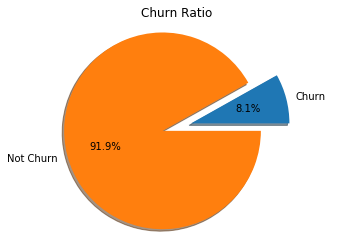

In [50]:
# Pie chart for imbalance ratio
labels = 'Churn', 'Not Churn'
sizes = [Churn[1],Churn[0]]
explode = (0,0.3)
fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode = explode , labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=360)
ax1.axis('equal') 
ax1.set_title('Churn Ratio')
plt.show()

#### Dropping all correlated variables of all the three months and dropping all derived variables from the Dataset

In [51]:
# Updating the dropping variable by adding 6th, 7th and 8th month and derived columns used for high customer filteration
dropping_var=['loc_og_mou_6','std_og_mou_6','total_og_mou_6','loc_ic_mou_6', 'std_ic_mou_6','total_ic_mou_6','max_rech_data_6','last_day_rch_amt_6','total_rech_num_6','count_rech_2g_6','count_rech_3g_6','loc_og_mou_7','std_og_mou_7','total_og_mou_7','loc_ic_mou_7', 'std_ic_mou_7','total_ic_mou_7','max_rech_data_7','last_day_rch_amt_7','total_rech_num_7','count_rech_2g_7','count_rech_3g_7','loc_og_mou_8','std_og_mou_8','total_og_mou_8','loc_ic_mou_8', 'std_ic_mou_8','total_ic_mou_8','max_rech_data_8','last_day_rch_amt_8','total_rech_num_8','count_rech_2g_8','count_rech_3g_8','Total_amount_6','Total_amount_7','Total_Avg_amount_6_7','Total_amnt_rech_data_6','Total_amnt_rech_data_7']

# Dropping date related columns as they are not of use for the analysation
Telecom_Df_HV.drop(dropping_var,axis=1,inplace=True)

#### Dropping all 9 month related columns, since we dont need them for modelling.

In [52]:
# Fetching all 9 month columns for dropping
columns_9 = Telecom_Df_HV.columns[Telecom_Df_HV.columns.str.contains(pat = '9')]
print(len(columns_9))
print(columns_9)

48
Index(['arpu_9', 'onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9',
       'roam_og_mou_9', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9',
       'loc_og_t2f_mou_9', 'loc_og_t2c_mou_9', 'loc_og_mou_9',
       'std_og_t2t_mou_9', 'std_og_t2m_mou_9', 'std_og_t2f_mou_9',
       'std_og_mou_9', 'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9',
       'total_og_mou_9', 'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_9',
       'loc_ic_t2f_mou_9', 'loc_ic_mou_9', 'std_ic_t2t_mou_9',
       'std_ic_t2m_mou_9', 'std_ic_t2f_mou_9', 'std_ic_mou_9',
       'total_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9',
       'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9',
       'last_day_rch_amt_9', 'total_rech_data_9', 'max_rech_data_9',
       'count_rech_2g_9', 'count_rech_3g_9', 'av_rech_amt_data_9',
       'vol_2g_mb_9', 'vol_3g_mb_9', 'arpu_3g_9', 'arpu_2g_9', 'monthly_2g_9',
       'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9', 'vbc_3g_9'],
      dtype='object')


In [53]:
# Dropping total usage which has been derived to tag churn
Telecom_Df_HV.drop('Total_Usage',axis=1,inplace=True)

In [54]:
# Dropping all 9th month related columns and checking the shape of the dataframe
Telecom_Df_HV.drop(columns_9,axis=1,inplace=True)
print('The shape of the dataframe after dropping all 9th month related columns : ',Telecom_Df_HV.shape)

The shape of the dataframe after dropping all 9th month related columns :  (30001, 114)


### EDA 

#### Offnet usage

In [55]:
# Function to calculate the mean of the features for churn and non churn
def mean_bar(x):
    # Fetches the feature from the dataset
    col=Telecom_df.columns[Telecom_df.columns.str.contains(pat = x)]
    # Filters all non churn customers from the dataset for that features
    df_0 = Telecom_Df_HV[Telecom_Df_HV.Churn==0].filter(col)
    # Filters all churn customers from the dataset for that features
    df_1 = Telecom_Df_HV[Telecom_Df_HV.Churn==1].filter(col)
    
    # Calculating mean
    mean_df_0 = pd.DataFrame([df_0.mean()],index={'Non Churn'})
    mean_df_1 = pd.DataFrame([df_1.mean()],index={'Churn'})

    frames = [mean_df_0, mean_df_1]
    mean_bar = pd.concat(frames)

    mean_bar.T.plot.bar(figsize=(10,5),rot=0)
    plt.show()
    return mean_bar    

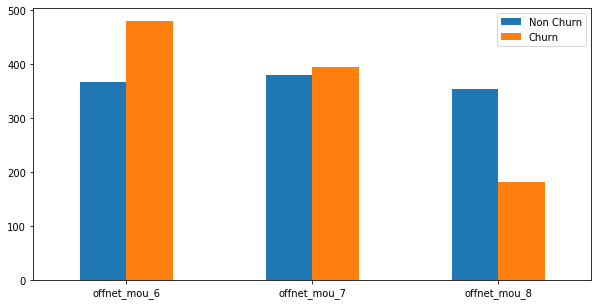

,offnet_mou_6,offnet_mou_7,offnet_mou_8
Non Churn,367.065958,379.658557,354.320568
Churn,480.103536,395.216279,180.889843


In [56]:
# Mean bar graph for offnet for the months 6,7,8
mean_bar("offnet")

From graph we can observe the offnet usage of churn people is gradually decreased from month 6 to 8

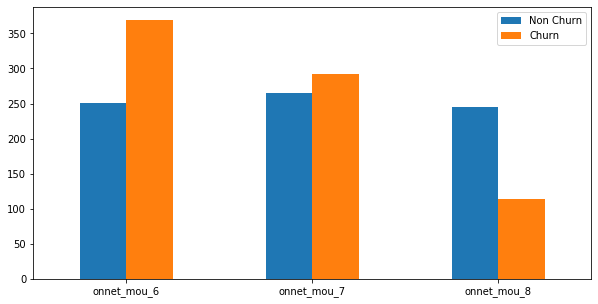

,onnet_mou_6,onnet_mou_7,onnet_mou_8
Non Churn,251.205992,265.643461,244.819433
Churn,369.058173,292.465153,113.238061


In [57]:
# Mean bar graph for onnet for the months 6,7,8
mean_bar("onnet")

onnet usage has been decreased in the 8 th month

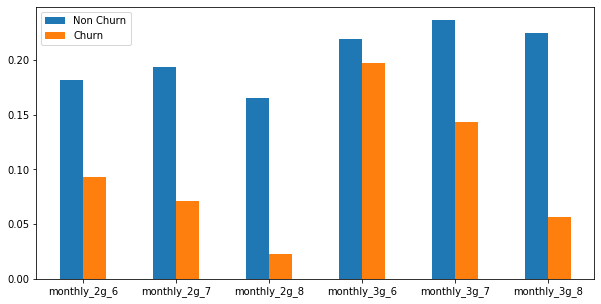

,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8
Non Churn,0.181676,0.193215,0.165203,0.219557,0.236575,0.224673
Churn,0.093404,0.070873,0.022941,0.197460,0.143794,0.056944


In [58]:
# Mean bar monthly for offnet for the months 6,7,8
mean_bar('monthly')

monthly usage for both 2g and 3g are reduced for 8th month

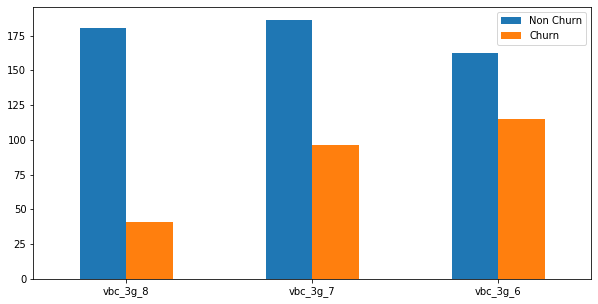

,vbc_3g_8,vbc_3g_7,vbc_3g_6
Non Churn,180.501280,186.206078,162.370343
Churn,40.851975,96.076317,115.096575


In [59]:
# Mean bar graph for vbc for the months 6,7,8
mean_bar("vbc")

Volume based cost - when no specific scheme is not purchased and paid as per usage
We can observe the value increasing for 8th month

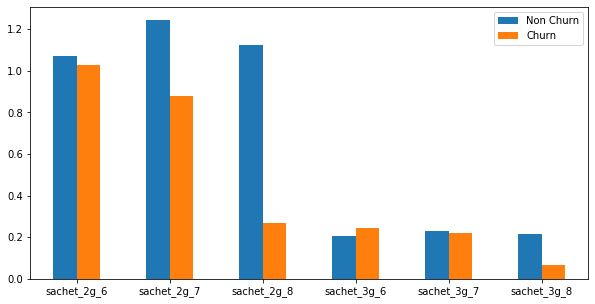

,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8
Non Churn,1.069303,1.243832,1.124383,0.206313,0.228048,0.214550
Churn,1.029496,0.877509,0.269971,0.244162,0.221221,0.065137


In [60]:
# Mean bar graph for sachet for the months 6,7,8
mean_bar('sachet')

For churners the sachet rate is decreased in the 8th month

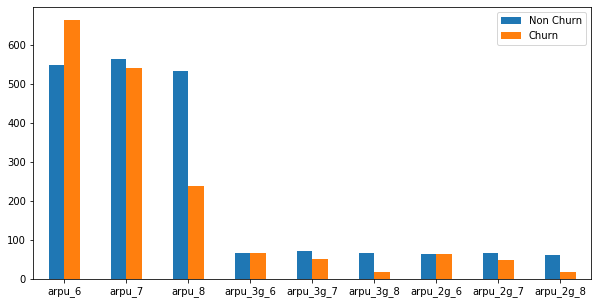

,arpu_6,arpu_7,arpu_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8
Non Churn,549.220390,562.608191,532.635710,67.129348,70.29823,66.732942,63.44175,66.127349,62.001196
Churn,663.158246,540.165968,237.200793,65.633425,49.68832,18.069345,63.41254,48.602122,17.683101


In [61]:
mean_bar('arpu')

In all the cases the average revenue is decreased for churners for the 8th month

In [62]:
# Dropping mobile number as it of no help
Telecom_Df_HV.drop('mobile_number',axis=1,inplace=True)

In [63]:
# Top 5 rows to see after dropping all the variables
Telecom_Df_HV.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,vbc_3g_8,vbc_3g_7,vbc_3g_6,Churn
0,197.385,214.816,213.803,0.00,0.00,0.00,141.433909,157.389481,0.00,25.405712,19.913848,0.00,14.738887,6.062548,0.00,45.26311,27.939687,0.00,93.34225,91.393563,0.00,3.753334,3.801267,0.00,0.0,0.0,0.00,94.695111,93.404881,0.00,87.361985,90.802683,0.00,1.093781,1.147202,0.00,0.0,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.0,63.71781,48.275642,0.16,107.482121,107.116539,4.13,12.076571,12.604581,1.15,31.814962,26.010865,0.00,20.721069,21.64772,0.00,2.157223,2.223094,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,362.0,252.0,252.0,252.0,252.0,252.0,1.0,1.0,1.0,252.0,252.0,252.0,30.13,1.32,5.75,83.57,150.76,109.61,212.17,212.17,212.17,212.17,212.17,212.17,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,968.0,30.40,0.00,101.20,1
1,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.430000,567.160000,325.91,16.230000,33.490000,31.64,23.740000,12.590000,38.06,51.39000,31.380000,40.28,308.63000,447.380000,162.28,62.130000,55.140000,53.23,0.0,0.0,0.00,4.300000,23.290000,12.01,49.890000,31.760000,49.14,6.660000,20.080000,16.68,0.0,0.18,10.01,4.5,0.0,6.50,0.0,0.0,0.0,58.14000,32.260000,27.31,217.560000,221.490000,121.19,152.160000,101.460000,39.53,36.890000,11.830000,30.39,91.440000,126.99000,141.33,52.190000,34.240000,22.21,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,1580.0,790.0,3638.0,1580.0,790.0,1580.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,802.0,57.74,19.38,18.74,1
2,378.721,492.223,137.362,413.69,351.03,35.08,94.660000,80.630000,136.48,0.000000,0.000000,0.00,0.000000,0.000000,0.00,297.13000,217.590000,12.49,80.96000,70.580000,50.54,0.000000,0.000000,0.00,0.0,0.0,7.15,116.560000,133.430000,22.58,13.690000,10.040000,75.69,0.000000,0.000000,0.00,0.0,0.00,0.00,0.0,0.0,10.23,0.0,0.0,0.0,23.84000,9.840000,0.31,57.580000,13.980000,15.48,0.000000,0.000000,0.00,0.000000,0.580000,0.10,22.430000,4.08000,0.65,0.000000,0.000000,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,437.0,601.0,120.0,90.0,154.0,30.0,0.0,2.0,3.0,0.0,177.0,69.0,0.00,356.00,0.03,0.00,750.95,11.94,0.00,0.00,19.83,0.00,0.00,0.00,0.0,1.0,0.0,0.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,315.0,21.03,910.65,122.16,0
3,514.453,597.753,637.760,102.41,132.11,85.14,757.930000,896.680000,983.39,0.000000,0.000000,0.00,0.000000,0.000000,0.00,4.48000,6.160000,23.34,91.81000,87.930000,104.81,0.750000,0.000000,1.58,0.0,0.0,0.00,97.930000,125.940000

In [64]:
# Fetching all 6 and 7 months columns and taking their average
col_list = Telecom_Df_HV.filter(regex='_6|_7').columns.str[:-2]
for idx, col in enumerate(col_list.unique()):
    avg_col_name = "avg_"+col+"_av67"
    col_6 = col+"_6"
    col_7 = col+"_7"
    Telecom_Df_HV[avg_col_name] = (Telecom_Df_HV[col_6]  + Telecom_Df_HV[col_7])/ 2

In [65]:
# Dropping all original columns of 6 and 7 as we have took the average
col_list_to_drop = Telecom_Df_HV.filter(regex='_6|_7')
Telecom_Df_HV.drop(col_list_to_drop,axis=1,inplace=True)
print (Telecom_Df_HV.shape)

(30001, 76)


### Outlier treatment

In [66]:
for i in Telecom_Df_HV.columns:
    percentiles = Telecom_Df_HV[i].quantile([0.05,0.95]).values
#     Telecom_Df_HV[i][Telecom_Df_HV[i] <= percentiles[0]] = percentiles[0]
    Telecom_Df_HV[i][Telecom_Df_HV[i] >= percentiles[1]] = percentiles[1]

In [67]:
# Dropping the variables with same values in the columns
Telecom_Df_HV = Telecom_Df_HV.loc[:,Telecom_Df_HV.apply(pd.Series.nunique) != 1]
print("The shape of the dataframe after dropping columns with unique values : ",Telecom_Df_HV.shape)

The shape of the dataframe after dropping columns with unique values :  (30001, 75)


In [68]:
# Info of the dataframe
Telecom_Df_HV.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,std_og_t2t_mou_8,std_og_t2m_mou_8,std_og_t2f_mou_8,isd_og_mou_8,spl_og_mou_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,loc_ic_t2f_mou_8,std_ic_t2t_mou_8,std_ic_t2m_mou_8,std_ic_t2f_mou_8,spl_ic_mou_8,isd_ic_mou_8,ic_others_8,total_rech_amt_8,max_rech_amt_8,total_rech_data_8,av_rech_amt_data_8,vol_2g_mb_8,vol_3g_mb_8,arpu_3g_8,arpu_2g_8,monthly_2g_8,sachet_2g_8,monthly_3g_8,sachet_3g_8,aon,vbc_3g_8,Churn,avg_arpu_av67,avg_onnet_mou_av67,avg_offnet_mou_av67,avg_roam_ic_mou_av67,avg_roam_og_mou_av67,avg_loc_og_t2t_mou_av67,avg_loc_og_t2m_mou_av67,avg_loc_og_t2f_mou_av67,avg_loc_og_t2c_mou_av67,avg_std_og_t2t_mou_av67,avg_std_og_t2m_mou_av67,avg_std_og_t2f_mou_av67,avg_isd_og_mou_av67,avg_spl_og_mou_av67,avg_og_others_av67,avg_loc_ic_t2t_mou_av67,avg_loc_ic_t2m_mou_av67,avg_loc_ic_t2f_mou_av67,avg_std_ic_t2t_mou_av67,avg_std_ic_t2m_mou_av67,avg_std_ic_t2f_mou_av67,avg_spl_ic_mou_av67,avg_isd_ic_mou_av67,avg_ic_others_av67,avg_total_rech_amt_av67,avg_max_rech_amt_av67,avg_total_rech_data_av67,avg_av_rech_amt_data_av67,avg_vol_2g_mb_av67,avg_vol_3g_mb_av67,avg_arpu_3g_av67,avg_arpu_2g_av67,avg_monthly_2g_av67,avg_sachet_2g_av67,avg_monthly_3g_av67,avg_sachet_3g_av67,avg_vbc_3g_av67
0,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.16,4.13,1.15,0.00,0.00,0.00,0.0,0.00,0.00,252.0,252.0,1.0,252.0,5.75,109.61,212.17,212.17,0.0,0.0,1.0,0.0,968.0,30.40,1,206.1005,0.00,149.411695,22.65978,10.400717,36.601398,92.367906,3.7773,0.0,94.049996,89.082334,1.120491,0.000,0.00,0.0,55.996726,107.29933,12.340576,28.912914,21.184395,2.190159,0.000,0.000,0.000,307.0,252.0,1.0,252.0,15.725,117.165,212.170,212.17,0.0,0.0,1.0,0.0,50.600
1,1255.019,52.29,325.91,31.64,38.06,40.28,162.28,28.39,0.00,12.01,49.14,5.93,0.36,6.50,27.31,121.19,39.53,30.39,114.08,10.49,0.0,31.59,3.73,1490.0,440.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,802.0,57.74,1,1188.9905,56.26,510.295000,24.86000,18.165000,41.385000,378.005000,29.7550,0.0,13.795000,40.825000,6.980000,0.090,2.25,0.0,45.200000,219.52500,70.500000,24.360000,109.215000,11.385000,0.105,8.295,4.545,1185.0,452.0,0.0,0.0,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,19.060
2,137.362,35.08,136.48,0.00,0.00,12.49,50.54,0.00,7.15,22.58,75.69,0.00,0.00,10.23,0.31,15.48,0.00,0.10,0.65,0.00,0.0,0.00,0.00,120.0,30.0,3.0,69.0,0.03,11.94,19.83,0.00,0.0,3.0,0.0,0.0,315.0,21.03,0,435.4720,382.36,87.645000,0.00000,0.000000,257.360000,75.770000,0.0000,0.0,124.995000,11.865000,0.000000,0.000,0.00,0.0,16.840000,35.78000,0.000000,0.290000,13.255000,0.000000,0.000,0.000,0.000,519.0,122.0,1.0,88.5,178.000,375.475,0.000,0.00,0.5,0.5,0.0,0.0,516.405
3,637.760,85.14,983.39,0.00,0.00,23.34,104.81,1.58,0.00,61.79,842.83,0.00,0.00,0.00,19.54,129.16,10.39,0.18,101.74,0.00,0.0,0.00,0.00,718.0,50.0,0.0,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,720.0,0.00,0,556.1030,117.26,827.305000,0.00000,0.000000,5.320000,89.870000,0.3750,0.0,111.935000,737.050000,0.000000,0.000,0.00,0.0,6.335000,96.43000,3.725000,10.020000,52.960000,0.000000,0.000,0.000,0.000,640.0,50.0,0.0,0.0,0.000,0.000,0.000,0.00,0.0,0.0,0.0,0.0,0.000
4,366.966,33.58,205.89,0.00,0.00,33.58,148.56,0.00,9.40,0.00,39.61,0.00,0.00,17.71,76.64,146.84,0.71,13.38,43.91,0.00,0.0,3.74,3.73,439.0,179.0,2.0,270.0,0.01,1009.92,197.27,150.67,0.0,0.0,1.0,1.0,604.0,40.45,0,134.1235,49.81,87.385000,0.00000,0.000000,49.810000,82.975000,0.0000,0.0,0.000000,4.355000,0.000000,0.005,0.05,0.0,40.875000,104.63500,0.000000,0.255000,8.660000,0.000000,0.000,14.115,2.675,227.0,89.5,1.0,178.0,0.240,299.545,153.285,150.89,0.0,0.0,1.0,0.0,25.930


#### Test Train Split

In [69]:
# Storing all dependent variables to X
X = Telecom_Df_HV.drop('Churn',axis=1)

# Storing the target variable in y
y = Telecom_Df_HV['Churn']

In [70]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X,y, train_size=0.7,test_size=0.3,random_state=100,stratify=y)

In [71]:
# Storing train columns into a variable for later usage
columns = X_train.columns

#### Scaling of the data

In [72]:
# # Using Standard scaler to standardise the data..
scaler = StandardScaler()

# Fit and transform on the train data
X_train=scaler.fit_transform(X_train)

# Transforming to test data
X_test=scaler.transform(X_test)

#### SMOTE for handling imbalance

In [73]:
# # Using SMOTE balancing technique
smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_sample(X_train, y_train)

In [74]:
# Making X_train and y_train to dataframe and series
X_train = pd.DataFrame(data=X_train, columns=columns)
y_train = pd.Series(y_train.tolist())

In [75]:
# Making X_train and y_train to dataframe and series
# X_test = pd.DataFrame(data=X_test, columns=columns)
# y_test = pd.Series(y_test.tolist())

In [76]:
# Checcking after SMOTE balancing technique is done
print("The main dataframe churn rate : ",round(Telecom_Df_HV['Churn'].mean(), 2))
print("After the SMOTE technique used the churn rate for X_train : ",round(y_train.mean(), 2))
print("The test dataframe churn rate: ",round(y_test.mean(), 2))

The main dataframe churn rate :  0.08
After the SMOTE technique used the churn rate for X_train :  0.5
The test dataframe churn rate:  0.08


### Applying PCA 

In [77]:
# Applying PCA on the train data
pca = PCA(svd_solver = 'randomized',random_state=42)
Churn_Pca_train = pca.fit_transform(X_train)

In [78]:
# Converting into a dataframe
Churn_Pca_train = pd.DataFrame({'PC1':pca.components_[0],'PC2':pca.components_[1], 'Feature':columns})
Churn_Pca_train.head()

,PC1,PC2,Feature
0,0.143897,0.247383,arpu_8
1,-0.023358,0.169578,onnet_mou_8
2,0.034728,0.217434,offnet_mou_8
3,-0.058002,0.039643,roam_ic_mou_8
4,-0.066777,0.093641,roam_og_mou_8


#### Visualising the features 

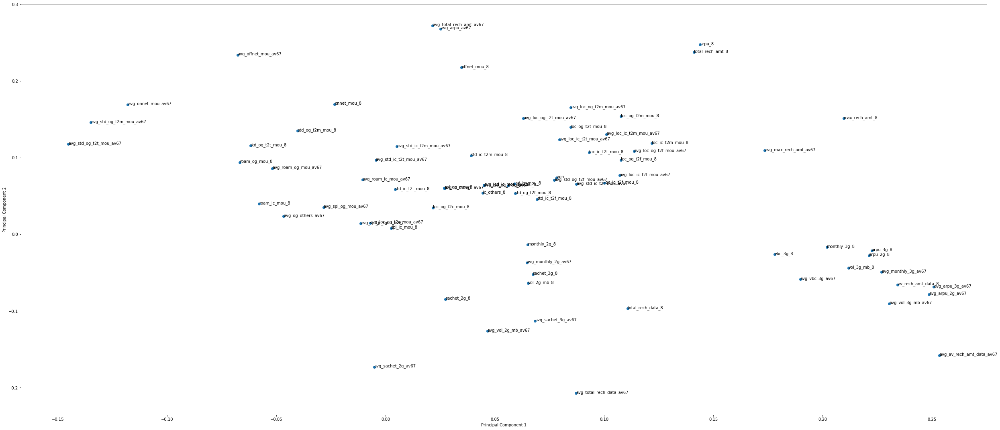

In [79]:
# Checking how features are loaded 
fig = plt.figure(figsize = (35, 15))
plt.scatter(Churn_Pca_train.PC1, Churn_Pca_train.PC2)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
for i, txt in enumerate(Churn_Pca_train.Feature):
    plt.annotate(txt, (Churn_Pca_train.PC1[i],Churn_Pca_train.PC2[i]))
plt.tight_layout()
plt.show()

In [80]:
# Checking the variance explanation ratio to the number of components
pd.Series(np.round(pca.explained_variance_ratio_.cumsum(), 4)*100)

0      13.26
1      24.99
2      31.97
3      38.01
4      42.50
5      46.72
6      50.46
7      53.90
8      56.86
9      59.38
10     61.58
11     63.64
12     65.62
13     67.40
14     69.15
15     70.79
16     72.38
17     73.78
18     75.14
19     76.44
20     77.72
21     78.99
22     80.18
23     81.25
24     82.25
25     83.18
26     84.09
27     84.96
28     85.79
29     86.61
30     87.40
31     88.13
32     88.85
33     89.55
34     90.22
35     90.87
36     91.50
37     92.11
38     92.68
39     93.22
40     93.73
41     94.21
42     94.63
43     95.04
44     95.44
45     95.84
46     96.21
47     96.58
48     96.89
49     97.18
50     97.45
51     97.71
52     97.96
53     98.20
54     98.41
55     98.60
56     98.79
57     98.93
58     99.06
59     99.19
60     99.30
61     99.40
62     99.49
63     99.57
64     99.64
65     99.70
66     99.76
67     99.82
68     99.87
69     99.91
70     99.94
71     99.96
72     99.98
73    100.00
dtype: float64

35 components explain about 95 % and 53 components explain about 98% .

In [81]:
# Taking the cumulative sum of the explained variance ratio in to a variable...
cumulative_variance=np.cumsum(pca.explained_variance_ratio_)

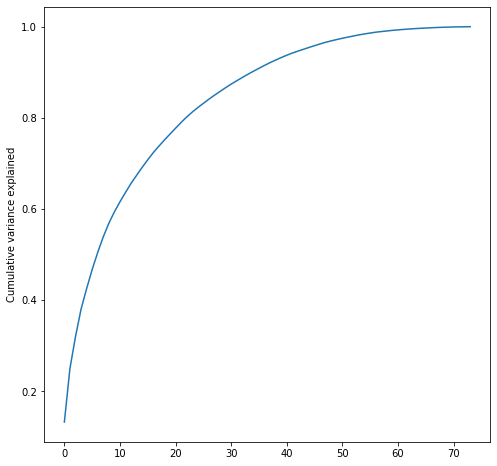

In [82]:
# Visualizing the  Cumulative Variance of the PCA components...
fig = plt.figure(figsize=[8,8])
plt.plot(cumulative_variance)
plt.ylabel("Cumulative variance explained")
plt.show()

In [83]:
# The first 53 components explains the max variance 95%
pca_final = IncrementalPCA(n_components=53)
Churn_Pca_train = pca_final.fit_transform(X_train)
Churn_Pca_train.shape

(38582, 53)

In [84]:
# Checking for the correlation of the PCA dataset
corrmat = np.corrcoef(Churn_Pca_train.transpose())
corrmat.shape

(53, 53)

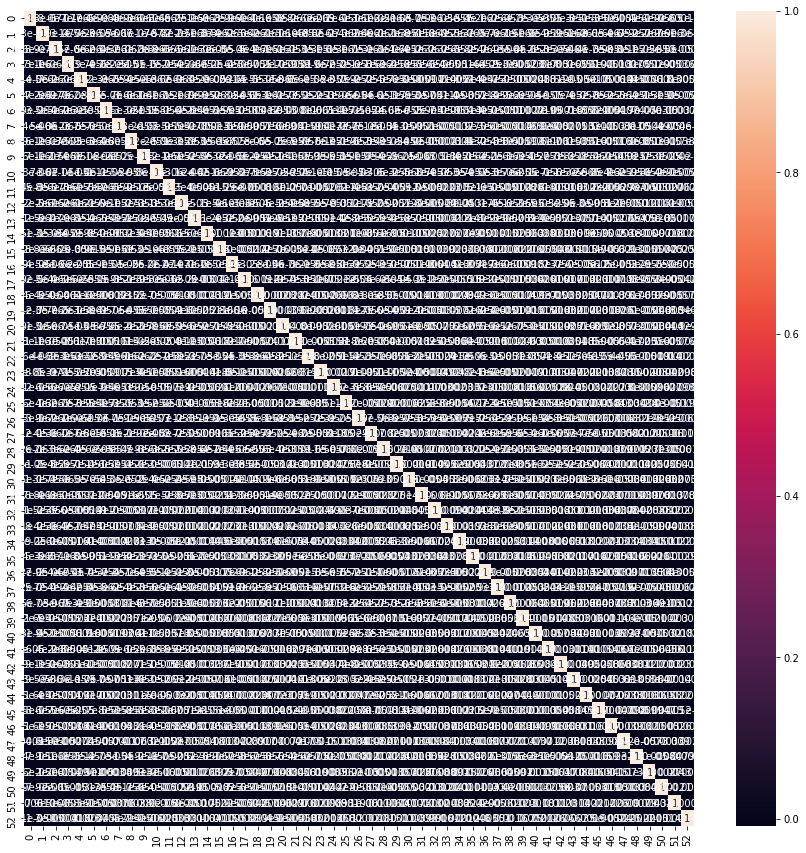

In [85]:
# Plotting heatmap...
plt.figure(figsize=[15,15])
sns.heatmap(corrmat, annot=True)

In [86]:
# Shape of the test set before transforming
print("The shape of the test set before transforming : ",X_test.shape)

The shape of the test set before transforming :  (9001, 74)


In [87]:
# Applying selected components to the test data - 63 components
Churn_Pca_test = pca_final.transform(X_test)
print('Test Shape = ', Churn_Pca_test.shape)

Test Shape =  (9001, 53)


#### Visualising to see if there is any pattern

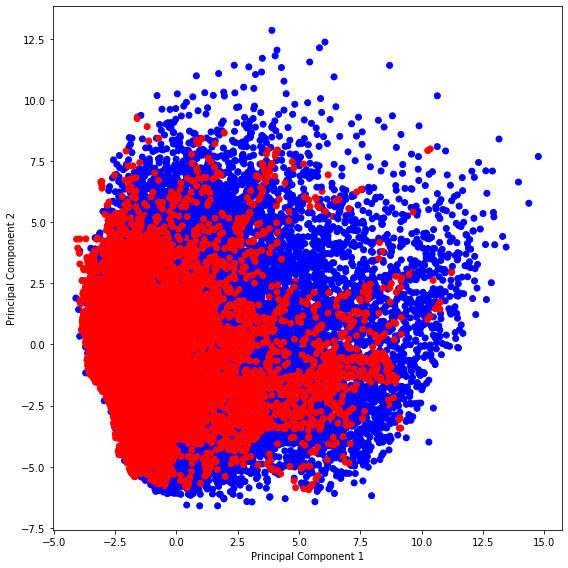

In [88]:
# Plot to see the pattern if any
fig = plt.figure(figsize = (8,8))
plt.scatter(Churn_Pca_train[:,0], Churn_Pca_train[:,1], c = y_train.map({0:'blue',1:'red'}))
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.tight_layout()
plt.show()
plt.rcdefaults()

### Model Building

#### User defined functions used for model building

In [89]:
consolidate_summary = pd.DataFrame()

In [90]:
# Function to print Confusion matrix, accuracy, sensitivity, specificity, 
# false postive rate, positive predictive value, Negative predictive value
def compute_and_print_metrics_from_confusion_matrix(y_test, y_pred):
    # Confusion matrix 
    confusion = metrics.confusion_matrix( y_test, y_pred )
    print('Confusion matrix')
    print(confusion)
    
    #Let's check the overall accuracy.
    overall_accuracy = metrics.accuracy_score( y_test, y_pred )
    print('\nOverall accuracy = ', overall_accuracy)


    TP = confusion[1, 1] # true positive  
    TN = confusion[0, 0] # true negatives
    FP = confusion[0, 1] # false positives
    FN = confusion[1, 0] # false negatives

    print(f'True positive = {TP}, true negatives = {TN}, false positives = {FP}, false negatives = {FN}')

    # sensitivity
    sensitivity = TP / float(TP+FN)
    print('\nSensitivity = ', sensitivity)

    # specificity
    specificity = TN / float(TN+FP)
    print('specificity = ', specificity)

    # false postive rate
    FPR = FP/ float(TN+FP)
    print('\nFalse postive rate = ', FPR)

    # positive predictive value 
    PPV = TP / float(TP+FP)
    print('positive predictive value = ', PPV)

    # Negative predictive value
    NPV = TN / float(TN+ FN)
    print('Negative predictive value = ', NPV)

In [91]:
def draw_roc( actual, probs ):

    # Restore the rc params from Matplotlib’s internal defaults.
    plt.rcdefaults()
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 4))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

In [92]:
def plot_confusion_matrix(cm):
    """
    This function prints and plots the confusion matrix.
    """
    classes=[0,1]
    cmap=plt.cm.Blues
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title('Confusion matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [93]:
# Printing the header 
def header(string):
    display(Markdown("------ "))
    display(Markdown("### "+string))

#Evaluating the metrics precisoon, recall,accuracy and roc score    
def print_model_metrics(y_test,y_pred,model_name):
    header(model_name+" Model Stats Scores Summary : ")
    cp = confusion_matrix(y_test,y_pred)
    plt.figure()
    plot_confusion_matrix(cp)
    plt.show()
    from sklearn.metrics import recall_score,precision_score,roc_auc_score,f1_score,accuracy_score
    accuracy = round(accuracy_score(y_test,y_pred),2)
    recall = round(recall_score(y_test,y_pred),2)
    precision = round(precision_score(y_test,y_pred),2)
    auc = round(roc_auc_score(y_test,y_pred),2)
    f1 = round(f1_score(y_test,y_pred),2)
    
    data = [[model_name,accuracy,precision,recall,auc,f1]] 
    df = pd.DataFrame(data, columns = ['Model', 'Accuracy','Precision','Recall','AUC','F1'])
    add_to_global_summary(df)
    return df 

def add_to_global_summary(df) :
    global consolidate_summary 
    consolidate_summary = consolidate_summary.append(df,ignore_index=True)

In [94]:
def probability_cutoffs(y_test, y_pred):
    # Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
    cutoff_df = pd.DataFrame( columns = ['probability','accuracy','sensitivity','specificity'])
    num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
    for i in num:
        # You can obtain all of the parameters from the confusion matrix.
        tn, fp, fn, tp = confusion_matrix( y_test, y_pred[i] ).ravel()
        accuracy = metrics.accuracy_score( y_test, y_pred[i] )
        sensi = tp/(tp+fn)
        speci = tn/(tn+fp)
        cutoff_df.loc[i] =[ i, accuracy, sensi, speci ]
    print(cutoff_df)

    # Restore the rc params from Matplotlib’s internal defaults.
    plt.rcdefaults()
    # Let's plot accuracy sensitivity and specificity for various probabilities.
    cutoff_df.plot.line(x='probability', y=['accuracy','sensitivity','specificity'])
    plt.show()

### Model 1

### Logistic Regression using PCA

In [95]:
# Logistic Regression Model
LR_PCA = LogisticRegression(class_weight='balanced',solver='liblinear',random_state=42)

Create Hyperparameter Search Space

In [96]:
# Create regularization penalty space
penalty = ['l1', 'l2']

# Create regularization hyperparameter space
# Choose 10 values between 0 and 4
C = np.logspace(0, 4, 10)
C

array([1.00000000e+00, 2.78255940e+00, 7.74263683e+00, 2.15443469e+01,
       5.99484250e+01, 1.66810054e+02, 4.64158883e+02, 1.29154967e+03,
       3.59381366e+03, 1.00000000e+04])

In [97]:
# Create hyperparameter options
hyperparameters = dict(C=C, penalty=penalty)
hyperparameters

{'C': array([1.00000000e+00, 2.78255940e+00, 7.74263683e+00, 2.15443469e+01,
        5.99484250e+01, 1.66810054e+02, 4.64158883e+02, 1.29154967e+03,
        3.59381366e+03, 1.00000000e+04]), 'penalty': ['l1', 'l2']}

Define Grid Search

In [98]:
# Create grid search using 5-fold cross validation
best_model = GridSearchCV(LR_PCA, hyperparameters, cv=5, n_jobs = -1, scoring='roc_auc', verbose=0)
best_model

GridSearchCV(cv=5, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight='balanced',
                                          dual=False, fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=42, solver='liblinear',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=-1,
             param_grid={'C': array([1.00000000e+00, 2.78255940e+00, 7.74263683e+00, 2.15443469e+01,
       5.99484250e+01, 1.66810054e+02, 4.64158883e+02, 1.29154967e+03,
       3.59381366e+03, 1.00000000e+04]),
                         'penalty': ['l1', 'l2']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
      

Fit Grid Search obtained  the best model

In [99]:
# Fit grid search
LR_PCA_Best = best_model.fit(Churn_Pca_train,y_train)
LR_PCA_Best

GridSearchCV(cv=5, error_score=nan,
             estimator=LogisticRegression(C=1.0, class_weight='balanced',
                                          dual=False, fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='auto',
                                          n_jobs=None, penalty='l2',
                                          random_state=42, solver='liblinear',
                                          tol=0.0001, verbose=0,
                                          warm_start=False),
             iid='deprecated', n_jobs=-1,
             param_grid={'C': array([1.00000000e+00, 2.78255940e+00, 7.74263683e+00, 2.15443469e+01,
       5.99484250e+01, 1.66810054e+02, 4.64158883e+02, 1.29154967e+03,
       3.59381366e+03, 1.00000000e+04]),
                         'penalty': ['l1', 'l2']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
      

In [100]:
# View best hyperparameters
print('Best Penalty:', LR_PCA_Best.best_estimator_.get_params()['penalty'])
print('Best C:', LR_PCA_Best.best_estimator_.get_params()['C'])

Best Penalty: l2
Best C: 1.0


In [101]:
# Predict probablity
pred_probs_test = LR_PCA_Best.predict_proba(Churn_Pca_test)[:,1]
pred_probs_test

array([0.0063165 , 0.05378641, 0.08993535, ..., 0.07598568, 0.5751336 ,
       0.03234785])

In [102]:
# Predicting the ROC_AUC value
roc_auc_score = "{:2.2f}".format(metrics.roc_auc_score(y_test, pred_probs_test))
print('roc_auc_score = ', roc_auc_score)

roc_auc_score =  0.89


Making Predictions on the model

In [103]:
# Predict target variable
y_pred = LR_PCA_Best.predict(Churn_Pca_test)
y_pred

array([0, 0, 0, ..., 0, 1, 0], dtype=int64)

In [104]:
# Converting pred_probs_test to a dataframe which is an array
y_pred_df = pd.DataFrame(pred_probs_test)

# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

# Removing index for both dataframes to append them side by side 
y_pred_df.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

# Appending y_test_df and y_pred_df
y_pred_final = pd.concat([y_test_df,y_pred_df],axis=1)

# Renaming the column 
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

# Rearranging the columns
y_pred_final = y_pred_final.reindex(['Churn','Churn_Prob'], axis=1)

y_pred_final.head()

,Churn,Churn_Prob
0,0,0.006316
1,0,0.053786
2,0,0.089935
3,0,0.879535
4,0,0.049441


In [105]:
# Creating new column 'predicted' with 1 if Churn_Prob>0.5 else 0
y_pred_final['predicted'] = y_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)

# Let's see some data
y_pred_final.head()

,Churn,Churn_Prob,predicted
0,0,0.006316,0
1,0,0.053786,0
2,0,0.089935,0
3,0,0.879535,1
4,0,0.049441,0


Confusion matrix, accuracy, sensitivity, specificity, false postive rate, positive predictive value, Negative predictive value of the model

In [106]:
# Printing Confusion metrics using user defined function
compute_and_print_metrics_from_confusion_matrix(y_pred_final.Churn, y_pred_final.predicted)

Confusion matrix
[[6903 1366]
 [ 146  586]]

Overall accuracy =  0.832018664592823
True positive = 586, true negatives = 6903, false positives = 1366, false negatives = 146

Sensitivity =  0.8005464480874317
specificity =  0.834804692223969

False postive rate =  0.16519530777603095
positive predictive value =  0.30020491803278687
Negative predictive value =  0.9792878422471273


In [107]:
# Printing Precision,Recall, f1_score 
print(classification_report( y_pred_final.Churn, y_pred_final.predicted ))

              precision    recall  f1-score   support

           0       0.98      0.83      0.90      8269
           1       0.30      0.80      0.44       732

    accuracy                           0.83      9001
   macro avg       0.64      0.82      0.67      9001
weighted avg       0.92      0.83      0.86      9001



------ 

### Logistic with PCA Model Stats Scores Summary : 

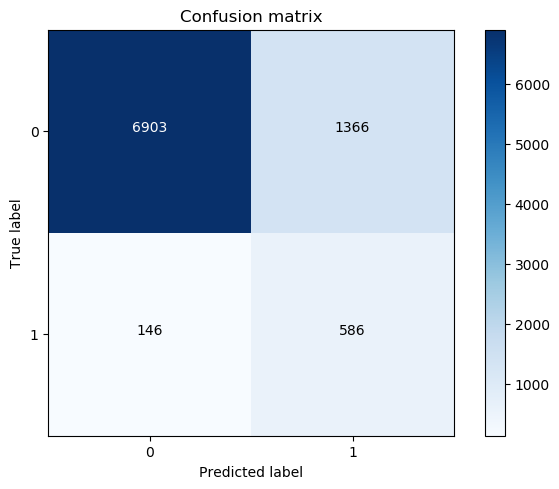

,Model,Accuracy,Precision,Recall,AUC,F1
0,Logistic with PCA,0.83,0.3,0.8,0.82,0.44


In [108]:

print_model_metrics( y_pred_final.Churn, y_pred_final.predicted,"Logistic with PCA")

 - Precision, Recall and F1-Score
 - Precision is the fraction of correctly predicted positives out of all predicted positives, i.e. it measures 'out of all        those the model has predicted to be positive, how many are correct'. It differs from sensitivity only in the denominator.
 - Recall is the same as sensitivity, and is commonly used along with precision.
 - F1-score is a measure that combines both precision and recall. It is the harmonic mean of precision and recall

#### ROC Curve

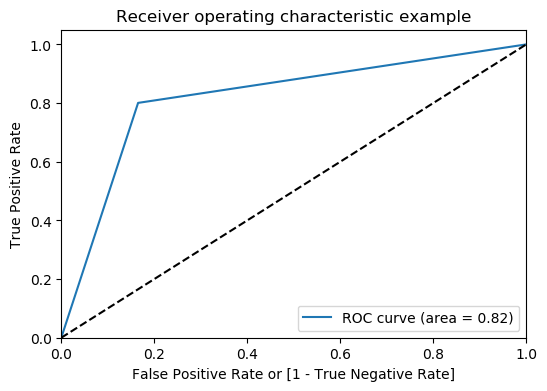

In [109]:
# Plotting ROC curve using user defined function
draw_roc(y_pred_final.Churn, y_pred_final.predicted)

An ROC curve demonstrates several things:

 - It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in    specificity).
 - The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
 - The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [110]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_pred_final[i]= y_pred_final.Churn_Prob.map( lambda x: 1 if x > i else 0)
y_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.006316,0,1,0,0,0,0,0,0,0,0,0
1,0,0.053786,0,1,0,0,0,0,0,0,0,0,0
2,0,0.089935,0,1,0,0,0,0,0,0,0,0,0
3,0,0.879535,1,1,1,1,1,1,1,1,1,1,0
4,0,0.049441,0,1,0,0,0,0,0,0,0,0,0


     probability  accuracy  sensitivity  specificity
0.0          0.0  0.081324     1.000000     0.000000
0.1          0.1  0.500167     0.960383     0.459427
0.2          0.2  0.642484     0.922131     0.617729
0.3          0.3  0.724253     0.882514     0.710243
0.4          0.4  0.782580     0.833333     0.778087
0.5          0.5  0.832019     0.800546     0.834805
0.6          0.6  0.870459     0.760929     0.880155
0.7          0.7  0.896456     0.702186     0.913653
0.8          0.8  0.915898     0.618852     0.942194
0.9          0.9  0.927786     0.412568     0.973395


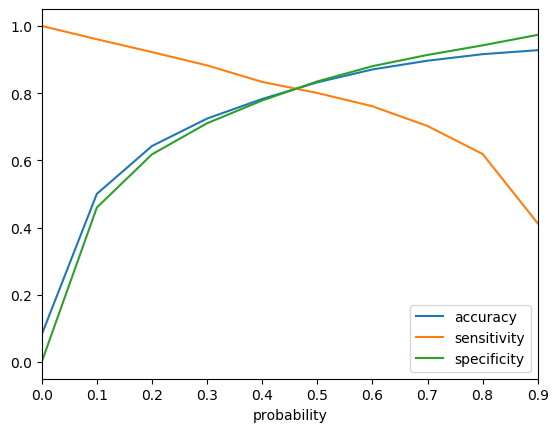

In [111]:
# Accuracy,Sensitivity and Specificity at various probability cutoffs
probability_cutoffs( y_pred_final.Churn, y_pred_final )

Finding Optimal Cutoff Point

In [112]:
# Predicting values at best threshold value
y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)
y_pred_final.head(20)

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.006316,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.053786,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.089935,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0.879535,1,1,1,1,1,1,1,1,1,1,0,1
4,0,0.049441,0,1,0,0,0,0,0,0,0,0,0,0
5,0,0.076252,0,1,0,0,0,0,0,0,0,0,0,0
6,0,0.133675,0,1,1,0,0,0,0,0,0,0,0,0
7,0,0.028972,0,1,0,0,0,0,0,0,0,0,0,0
8,0,0.512684,1,1,1,1,1,1,1,0,0,0,0,1
9,0,0.161090,0,1,1,0,0,0,0,0,0,0,0,0


In [113]:
# Let's check the overall accuracy.
metrics.accuracy_score( y_pred_final.Churn, y_pred_final.final_predicted)

0.832018664592823

In [114]:
# Printing the confusion metrics for best threshold value
metrics.confusion_matrix( y_pred_final.Churn, y_pred_final.final_predicted )

array([[6903, 1366],
       [ 146,  586]], dtype=int64)

In [115]:
# Printing Precision, Recall and f1_score
print(classification_report(y_pred_final.Churn, y_pred_final.final_predicted))

              precision    recall  f1-score   support

           0       0.98      0.83      0.90      8269
           1       0.30      0.80      0.44       732

    accuracy                           0.83      9001
   macro avg       0.64      0.82      0.67      9001
weighted avg       0.92      0.83      0.86      9001



In [116]:
# Printing Accuracy,Sensitivity and Specificity using user defined function
compute_and_print_metrics_from_confusion_matrix(y_pred_final.Churn, y_pred_final.final_predicted)

Confusion matrix
[[6903 1366]
 [ 146  586]]

Overall accuracy =  0.832018664592823
True positive = 586, true negatives = 6903, false positives = 1366, false negatives = 146

Sensitivity =  0.8005464480874317
specificity =  0.834804692223969

False postive rate =  0.16519530777603095
positive predictive value =  0.30020491803278687
Negative predictive value =  0.9792878422471273


------ 

### Logistic With PCA  Model Stats Scores Summary : 

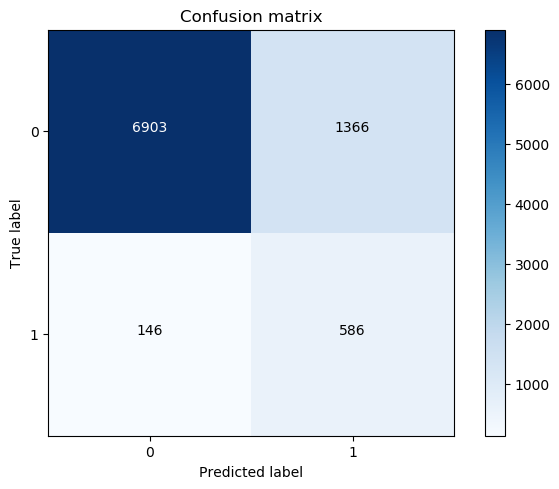

,Model,Accuracy,Precision,Recall,AUC,F1
0,Logistic With PCA,0.83,0.3,0.8,0.82,0.44


In [117]:
print_model_metrics( y_pred_final.Churn, y_pred_final.predicted,"Logistic With PCA ")

#### Evaluating Error Terms

Let's now evaluate the model in terms of its assumptions. We should test that:
 - The error terms are normally distributed with mean approximately 0
 - There is little correlation between the predictors
 - Homoscedasticity, i.e. the 'spread' or 'variance' of the error term (y_true-y_pred) is constant

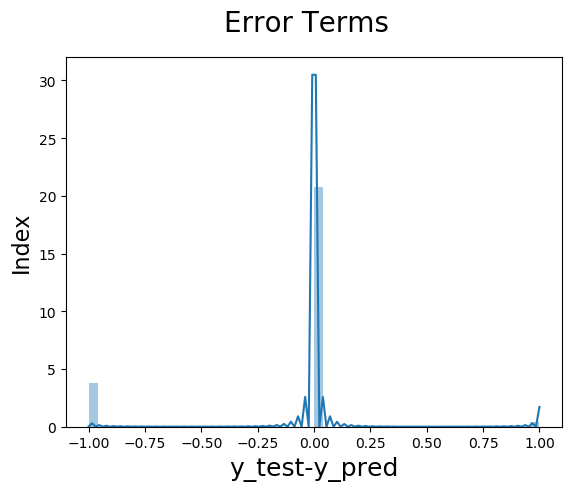

In [118]:
# Plotting the error terms to understand the distribution.
fig = plt.figure()
sns.distplot((y_pred_final.Churn-y_pred_final.final_predicted),bins=50)
fig.suptitle('Error Terms', fontsize=20)                  # Plot heading 
plt.xlabel('y_test-y_pred', fontsize=18)                  # X-label
plt.ylabel('Index', fontsize=16)                          # Y-label
plt.show()

In [119]:
# Mean
np.mean(y_pred_final.Churn-y_pred_final.final_predicted)

-0.13554049550049996

 Inference for Logisitc Regression with PCA:
 
- Logistic Regression with PCA and with hyper tuning has given an accuracy of 83% and sensitivity of 80% and mean error of -0.13

### Convert PCA result data set to data frame

In [120]:
# Converting Churn PCA train and Churn PCA test to dataframes
PCA_train = pd.DataFrame(Churn_Pca_train)
PCA_test = pd.DataFrame(Churn_Pca_test)
print(PCA_train.shape)
print(PCA_test.shape)

(38582, 53)
(9001, 53)


### Model 2

### Decision Tree with PCA

With Default parameters

In [121]:
# Fitting the decision tree with default hyperparameters, apart from
# max_depth which is 5 so that we can plot and read the tree.
DT = DecisionTreeClassifier(class_weight='balanced',max_depth=5,random_state=42)
DT.fit(PCA_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight='balanced', criterion='gini',
                       max_depth=5, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=42, splitter='best')

Confusion matrix
[[6652 1617]
 [ 205  527]]

Overall accuracy =  0.7975780468836796
True positive = 527, true negatives = 6652, false positives = 1617, false negatives = 205

Sensitivity =  0.7199453551912568
specificity =  0.804450356754142

False postive rate =  0.19554964324585802
positive predictive value =  0.24580223880597016
Negative predictive value =  0.9701035438238297
              precision    recall  f1-score   support

           0       0.97      0.80      0.88      8269
           1       0.25      0.72      0.37       732

    accuracy                           0.80      9001
   macro avg       0.61      0.76      0.62      9001
weighted avg       0.91      0.80      0.84      9001



------ 

### Decision Tree with PCA  Model Stats Scores Summary : 

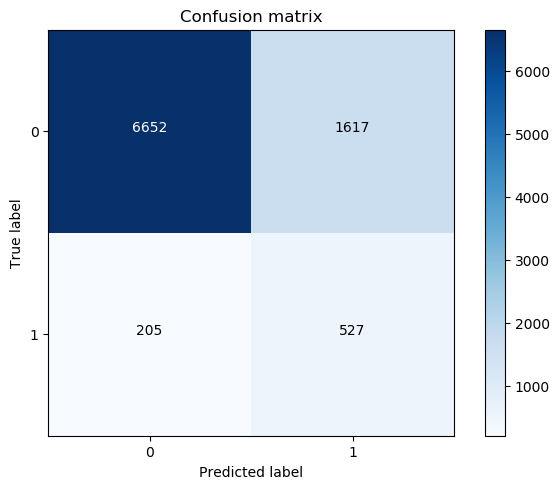

,Model,Accuracy,Precision,Recall,AUC,F1
0,Decision Tree with PCA,0.8,0.25,0.72,0.76,0.37


In [122]:
# Making predictions using default parameters
y_pred_DT = DT.predict(PCA_test)

# Printing the metrics using user defined function
compute_and_print_metrics_from_confusion_matrix(y_test, y_pred_DT)
print(classification_report(y_test, y_pred_DT))
print_model_metrics( y_test, y_pred_DT,"Decision Tree with PCA ")

In [123]:
# Create the parameter grid 
param_grid = {
    'max_depth': range(8, 17, 2),
    'min_samples_leaf': range(50, 150, 50),
    'min_samples_split': range(50, 150, 50),
    'criterion': ["entropy", "gini"]
}

# Instantiate the grid search model
DT_Tuned = DecisionTreeClassifier(class_weight='balanced',random_state=42)
best_model = GridSearchCV(estimator = DT_Tuned, param_grid = param_grid, 
                              cv = 5, verbose = 1, scoring='roc_auc', n_jobs = -1, return_train_score=True)

# Fit the grid search to the data
best_model.fit(PCA_train,y_train)

Fitting 5 folds for each of 40 candidates, totalling 200 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   22.9s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 200 out of 200 | elapsed:  1.7min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=42,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'crit

In [124]:
# CV results
cv_results = pd.DataFrame(best_model.cv_results_)

In [125]:
# printing the optimal accuracy score and hyperparameters
print("Best accuracy = ", best_model.best_score_)
print("\nBest_estimator = ", best_model.best_estimator_)

Best accuracy =  0.9230632028823266

Best_estimator =  DecisionTreeClassifier(ccp_alpha=0.0, class_weight='balanced',
                       criterion='entropy', max_depth=14, max_features=None,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=50,
                       min_samples_split=50, min_weight_fraction_leaf=0.0,
                       presort='deprecated', random_state=42, splitter='best')


In [126]:
# model with optimal hyperparameters
clf_entropy = best_model.best_estimator_
clf_entropy.fit(PCA_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight='balanced',
                       criterion='entropy', max_depth=14, max_features=None,
                       max_leaf_nodes=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=50,
                       min_samples_split=50, min_weight_fraction_leaf=0.0,
                       presort='deprecated', random_state=42, splitter='best')

In [127]:
# Importing required packages for visualization
from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz
import os

# If you're on windows:
# Specifing path for dot file.
if os.sys.platform == 'win32':
    if 'PROGRAMFILES' in os.environ:
        # os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/graphviz-2.38/release/bin/'
        os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'
    else:
        os.environ["PATH"] += os.pathsep + "C:/Program Files/Graphviz2.38/bin/" 

# plotting the tree
dot_data = StringIO()
export_graphviz(clf_entropy, out_file=dot_data,filled=True,rounded=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

In [128]:
# Making predictions
y_pred_DT = clf_entropy.predict(PCA_test)

Confusion matrix
[[6876 1393]
 [ 222  510]]

Overall accuracy =  0.8205754916120431
True positive = 510, true negatives = 6876, false positives = 1393, false negatives = 222

Sensitivity =  0.6967213114754098
specificity =  0.8315394848228322

False postive rate =  0.16846051517716773
positive predictive value =  0.2679978980557015
Negative predictive value =  0.9687235841081995
              precision    recall  f1-score   support

           0       0.97      0.83      0.89      8269
           1       0.27      0.70      0.39       732

    accuracy                           0.82      9001
   macro avg       0.62      0.76      0.64      9001
weighted avg       0.91      0.82      0.85      9001



------ 

### Decision Tree with PCA  after tuning Model Stats Scores Summary : 

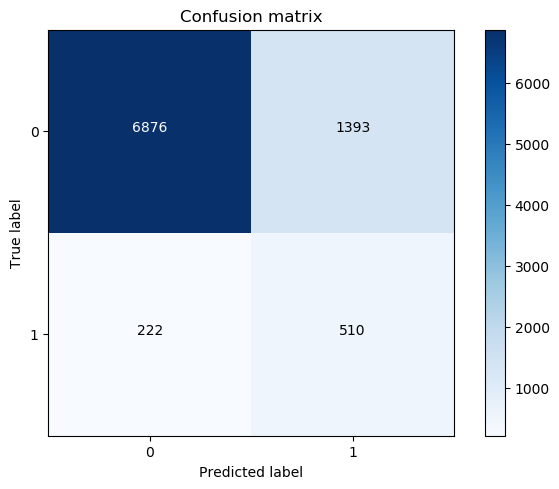

,Model,Accuracy,Precision,Recall,AUC,F1
0,Decision Tree with PCA after tuning,0.82,0.27,0.7,0.76,0.39


In [129]:
compute_and_print_metrics_from_confusion_matrix(y_test,y_pred_DT)

# classification metrics
print(classification_report(y_test, y_pred_DT))
print_model_metrics( y_test, y_pred_DT,"Decision Tree with PCA  after tuning")

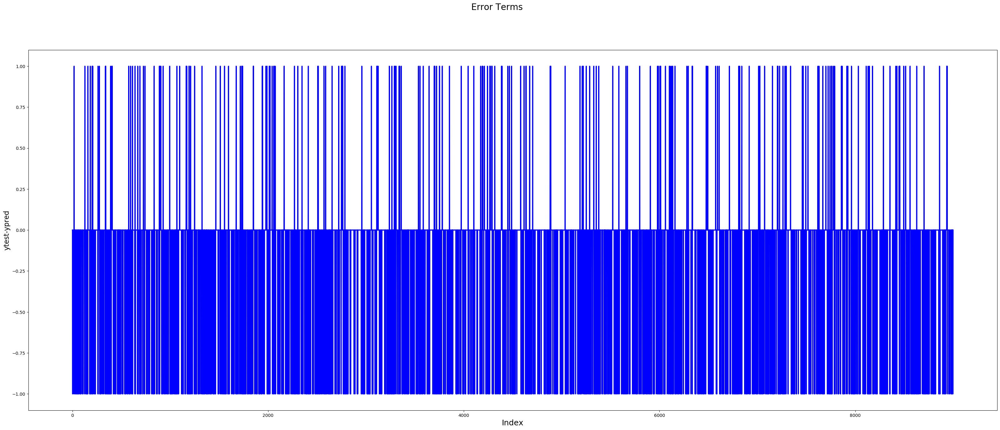

In [130]:
# Error terms
c = [i for i in range(len(y_pred_DT))]
fig = plt.figure(figsize=(40, 15))
plt.plot(c, y_test-y_pred_DT, color="blue", linewidth=2.5, linestyle="-")
fig.suptitle('Error Terms', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                      # X-label
plt.ylabel('ytest-ypred', fontsize=16)                # Y-label
plt.show()

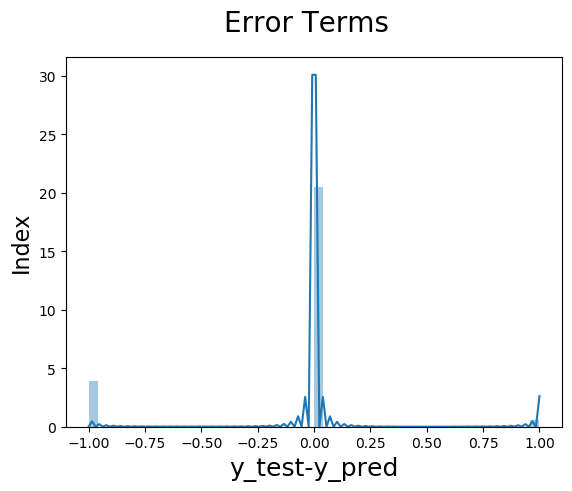

In [131]:
# Plotting the error terms to understand the distribution.
fig = plt.figure()
sns.distplot((y_test-y_pred_DT),bins=50)
fig.suptitle('Error Terms', fontsize=20)                  # Plot heading 
plt.xlabel('y_test-y_pred', fontsize=18)                  # X-label
plt.ylabel('Index', fontsize=16)                          # Y-label
plt.show()

In [132]:
# Mean
np.mean(y_test-y_pred_DT)

-0.13009665592711922

#### Bagging technique on Decision Tree

Confusion matrix
[[6926 1343]
 [ 195  537]]

Overall accuracy =  0.8291300966559271
True positive = 537, true negatives = 6926, false positives = 1343, false negatives = 195

Sensitivity =  0.7336065573770492
specificity =  0.8375861651953078

False postive rate =  0.16241383480469224
positive predictive value =  0.2856382978723404
Negative predictive value =  0.9726162055891027
              precision    recall  f1-score   support

           0       0.97      0.84      0.90      8269
           1       0.29      0.73      0.41       732

    accuracy                           0.83      9001
   macro avg       0.63      0.79      0.66      9001
weighted avg       0.92      0.83      0.86      9001



------ 

### Decision Tree with PCA using Bagging Model Stats Scores Summary : 

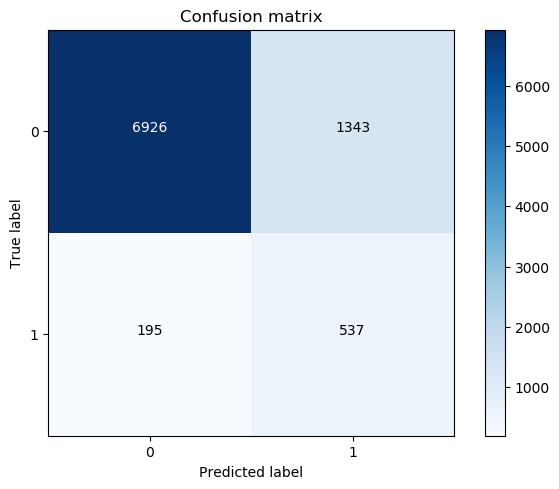

,Model,Accuracy,Precision,Recall,AUC,F1
0,Decision Tree with PCA using Bagging,0.83,0.29,0.73,0.79,0.41


In [133]:
from sklearn.ensemble import BaggingClassifier
DT = DecisionTreeClassifier(class_weight='balanced',max_depth=5,random_state=42)
bag_model=BaggingClassifier(base_estimator=DT, n_estimators=100, bootstrap=True)
bag_model=bag_model.fit(Churn_Pca_train,y_train)
ytest_pred=bag_model.predict(Churn_Pca_test)
compute_and_print_metrics_from_confusion_matrix(y_pred_final.Churn, ytest_pred) 
print(classification_report( y_pred_final.Churn, ytest_pred))
print_model_metrics( y_pred_final.Churn, ytest_pred,"Decision Tree with PCA using Bagging")

Inference for Decision Tree with PCA¶
 - without tuning : accuracy 80% and sensitivity 72%
 - with tuning : accuracy 82% and sensitivty 70%
 - using bagging method : accuracy 82% and sensitivity 73%

### Model 3

### Random Forest with PCA

Fitting the model with default parameters

In [134]:
# Running the random forest with default parameters.
RF = RandomForestClassifier(class_weight='balanced',random_state=42)
# fit
RF.fit(PCA_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)

In [135]:
# Making predictions
RF_predictions = RF.predict(PCA_test)

Confusion matrix
[[7879  390]
 [ 335  397]]

Overall accuracy =  0.9194533940673258
True positive = 397, true negatives = 7879, false positives = 390, false negatives = 335

Sensitivity =  0.5423497267759563
specificity =  0.952835893094691

False postive rate =  0.047164106905308985
positive predictive value =  0.5044472681067345
Negative predictive value =  0.9592159727294862
              precision    recall  f1-score   support

           0       0.96      0.95      0.96      8269
           1       0.50      0.54      0.52       732

    accuracy                           0.92      9001
   macro avg       0.73      0.75      0.74      9001
weighted avg       0.92      0.92      0.92      9001



------ 

### Random Forest with PCA  Model Stats Scores Summary : 

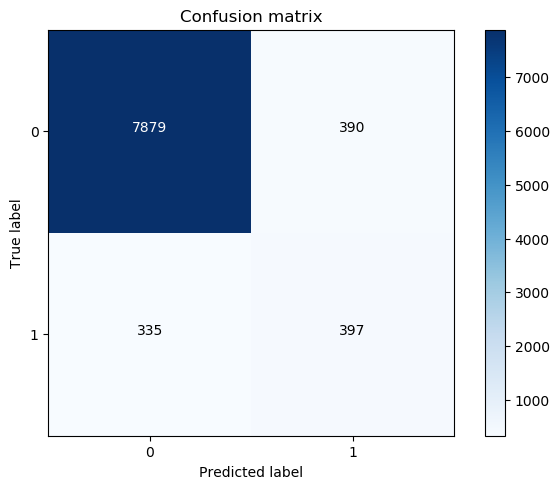

,Model,Accuracy,Precision,Recall,AUC,F1
0,Random Forest with PCA,0.92,0.5,0.54,0.75,0.52


In [136]:
# Printing the metrics using user defined function
compute_and_print_metrics_from_confusion_matrix(y_test, RF_predictions)
print(classification_report(y_test, RF_predictions))
print_model_metrics( y_test, RF_predictions,"Random Forest with PCA ")

In [137]:
# parameters to build the model on : note we are specifying low number of estimators so tree do not overfit
parameters = {'n_estimators': [10], 'max_depth': range(2, 20, 5)}

# instantiate the model
RF_tune = RandomForestClassifier(class_weight='balanced',random_state=42)

# fit tree on training data
RF_tune = GridSearchCV(RF_tune, parameters, cv=4, n_jobs = -1, scoring="roc_auc", return_train_score=True)
RF_tune.fit(PCA_train, y_train)

GridSearchCV(cv=4, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=42,
                            

In [138]:
# scores of GridSearch CV
scores = RF_tune.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,0.659217,0.036016,0.020152,0.000010,2,10,"{'max_depth': 2, 'n_estimators': 10}",0.817035,0.849906,0.853696,0.853881,0.843629,0.015436,4,0.843574,0.847498,0.842893,0.849332,0.845824,0.002682
1,1.767742,0.040902,0.024163,0.004023,7,10,"{'max_depth': 7, 'n_estimators': 10}",0.912571,0.929259,0.931255,0.925912,0.924749,0.007286,3,0.937319,0.938164,0.935282,0.937254,0.937005,0.001057
2,2.556382,0.023252,0.025684,0.003592,12,10,"{'max_depth': 12, 'n_estimators': 10}",0.964969,0.970074,0.968538,0.965268,0.967212,0.002166,2,0.987390,0.985456,0.985425,0.986782,0.986263,0.000851
3,2.633308,0.091175,0.020232,0.000015,17,10,"{'max_depth': 17, 'n_estimators': 10}",0.976815,0.980402,0.980319,0.977401,0.978734,0.001640,1,0.996509,0.996017,0.996470,0.997152,0.996537,0.000404


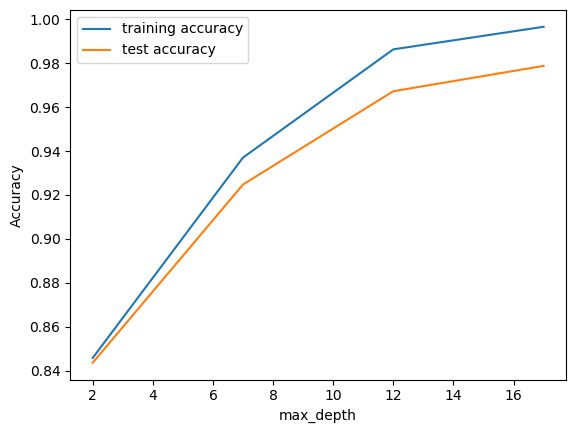

In [139]:
# plotting accuracies with max_depth
plt.figure()
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_depth")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

You can see that as we increase the value of max_depth, both train and test scores increase till 16 

We can use the range 12 to 16 as optimal value.

In [140]:
# Defining max depth range
max_depth = range(12,16, 1)
max_depth

range(12, 16)

In [141]:
# parameters to build the model on
parameters = {'n_estimators': range(100, 700, 200)}

# instantiate the model (note we are specifying a max_depth)
RF_tune = RandomForestClassifier(class_weight='balanced',max_depth=3, random_state=42)

# fit tree on training data
RF_tune = GridSearchCV(RF_tune, parameters, cv=5, n_jobs = -1, scoring="roc_auc", return_train_score=True)
RF_tune.fit(PCA_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=3,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=42,
                               

In [142]:
# scores of GridSearch CV
scores = RF_tune.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,9.976837,0.379803,0.105718,0.003836,100,{'n_estimators': 100},0.871473,0.885924,0.899567,0.894108,0.893331,0.888881,0.009727,1,0.896762,0.892985,0.889434,0.890003,0.892417,0.892320,0.002603
1,30.357418,0.371619,0.289149,0.014085,300,{'n_estimators': 300},0.868702,0.884664,0.898493,0.891948,0.889716,0.886705,0.010038,3,0.893492,0.891267,0.887577,0.887841,0.890066,0.890049,0.002206
2,42.079084,4.505723,0.320230,0.068603,500,{'n_estimators': 500},0.868864,0.884792,0.898734,0.892788,0.889990,0.887034,0.010138,2,0.893199,0.891699,0.888045,0.888764,0.890396,0.890420,0.001884


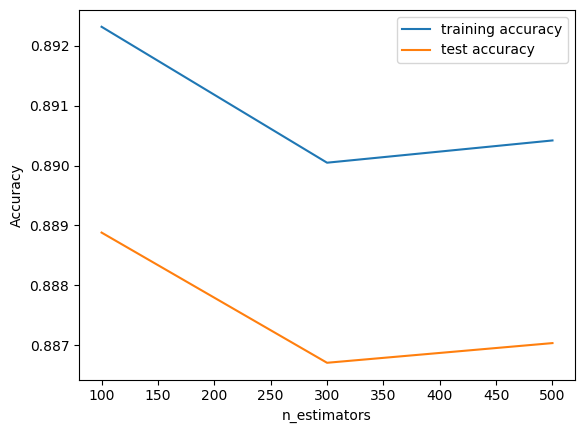

In [143]:
# plotting accuracies with n_estimators
plt.figure()
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("n_estimators")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

You can see that as we increase the value of n_estimators, both train and test scores decresase from 100 
We can use 100 and 300.

In [144]:
# Defining n estimators after finding the best value
n_estimators = [100, 300]

Tuning max_features
Let's see how the model performance varies with max_features, which is the maximum numbre of features considered for splitting at a node.

In [145]:
# parameters to build the model on
parameters = {'n_estimators': [10], 'max_features': [3, 5, 7, 9, 11, 13]}

# instantiate the model
RF_tune = RandomForestClassifier(class_weight='balanced',max_depth=4, random_state=42)

# fit tree on training data
RF_tune = GridSearchCV(RF_tune, parameters, cv=4, n_jobs = -1, scoring="roc_auc", return_train_score=True)
RF_tune.fit(PCA_train, y_train)

GridSearchCV(cv=4, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=4,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=42,
                               

In [146]:
# scores of GridSearch CV
scores = RF_tune.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_features,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,0.578251,0.008827,0.022176,0.003476,3,10,"{'max_features': 3, 'n_estimators': 10}",0.859409,0.882532,0.880551,0.880255,0.875687,0.009439,5,0.888935,0.880721,0.876125,0.879160,0.881235,0.004743
1,0.896290,0.019150,0.023207,0.003016,5,10,"{'max_features': 5, 'n_estimators': 10}",0.845012,0.866598,0.883578,0.878060,0.868312,0.014781,6,0.869547,0.868132,0.877175,0.877510,0.873091,0.004282
2,1.215605,0.012621,0.026691,0.003871,7,10,"{'max_features': 7, 'n_estimators': 10}",0.860019,0.881117,0.887839,0.887242,0.879055,0.011301,4,0.887863,0.879088,0.881213,0.887685,0.883962,0.003886
3,1.503330,0.018399,0.020171,0.000018,9,10,"{'max_features': 9, 'n_estimators': 10}",0.868503,0.888591,0.892898,0.888365,0.884589,0.009461,3,0.894158,0.889515,0.889198,0.888959,0.890458,0.002146
4,1.804970,0.014444,0.024557,0.002877,11,10,"{'max_features': 11, 'n_estimators': 10}",0.873915,0.889595,0.896549,0.889340,0.887350,0.008278,2,0.894309,0.892184,0.891610,0.889794,0.891974,0.001611


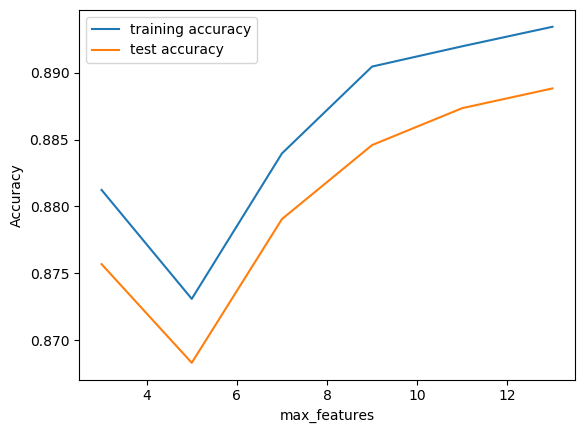

In [147]:
# plotting accuracies with max_features
plt.figure()
plt.plot(scores["param_max_features"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_max_features"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("max_features")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

Apparently, the training and test scores both seem to increase till 5, and then decreases and increases again

We can use 6 and 12.

In [148]:
# Defining max features after finding the best value
max_features = [6, 12]

Tuning min_samples_leaf¶
Check the optimum value for min samples leaf in our case

The hyperparameter min_samples_leaf is the minimum number of samples required to be at a leaf node:

If int, then consider min_samples_leaf as the minimum number.
If float, then min_samples_leaf is a percentage and ceil(min_samples_leaf * n_samples) are the minimum number of samples for each node.

In [149]:
# parameters to build the model on
parameters = {'n_estimators': [10], 'min_samples_leaf': range(100, 400, 50)}

# instantiate the model
RF_tune= RandomForestClassifier(class_weight='balanced',random_state=42)

# fit tree on training data
RF_tune = GridSearchCV(RF_tune, parameters, cv=4, n_jobs = -1, scoring="roc_auc", return_train_score=True)
RF_tune.fit(PCA_train, y_train)

GridSearchCV(cv=4, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=42,
                            

In [150]:
# scores of GridSearch CV
scores = RF_tune.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,2.634928,0.091064,0.026215,0.004028,100,10,"{'min_samples_leaf': 100, 'n_estimators': 10}",0.921052,0.934844,0.938723,0.933211,0.931957,0.006607,1,0.947141,0.942042,0.941369,0.943408,0.943490,0.002232
1,2.361372,0.038721,0.029257,0.001059,150,10,"{'min_samples_leaf': 150, 'n_estimators': 10}",0.912229,0.927913,0.930650,0.926309,0.924275,0.007126,2,0.935367,0.932201,0.932408,0.934404,0.933595,0.001337
2,2.304625,0.072815,0.030242,0.000015,200,10,"{'min_samples_leaf': 200, 'n_estimators': 10}",0.902857,0.922638,0.924990,0.921756,0.918060,0.008857,3,0.928062,0.926901,0.923735,0.928317,0.926754,0.001823
3,2.171058,0.065404,0.028218,0.003484,250,10,"{'min_samples_leaf': 250, 'n_estimators': 10}",0.902695,0.920678,0.921541,0.916336,0.915313,0.007547,4,0.926969,0.923305,0.919072,0.922348,0.922923,0.002814
4,2.102658,0.080598,0.025756,0.002473,300,10,"{'min_samples_leaf': 300, 'n_estimators': 10}",0.894800,0.917421,0.919015,0.912241,0.910869,0.009610,5,0.921187,0.918702,0.916510,0.917030,0.918357,0.001823


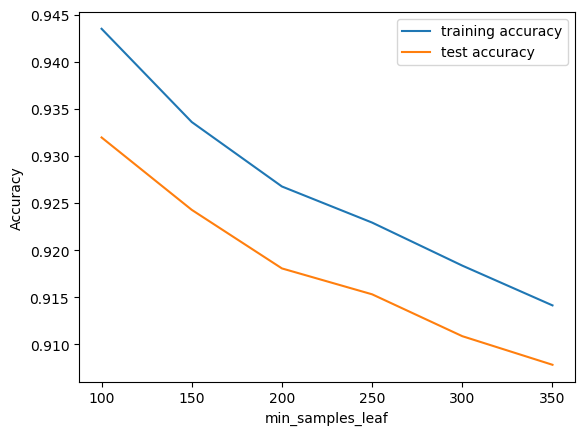

In [151]:
# plotting accuracies with min_samples_leaf
plt.figure()
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_leaf")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

We can use the range 100 to 150 for min_samples_leaf.



In [152]:
# Defining min_samples_leaf with best value
min_samples_leaf = range(100, 150, 50)

Tuning min_samples_split
Let's now look at the performance of the ensemble as we vary min_samples_split.

In [153]:
# parameters to build the model on
parameters = {'n_estimators': [10], 'min_samples_split': range(200, 500, 50)}

# instantiate the model
RF_tune= RandomForestClassifier(class_weight='balanced',random_state=42)

# fit tree on training data
RF_tune = GridSearchCV(RF_tune, parameters, cv=4, n_jobs = -1, scoring="roc_auc", return_train_score=True)
RF_tune.fit(PCA_train, y_train)

GridSearchCV(cv=4, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=42,
                            

In [154]:
# scores of GridSearch CV
scores = RF_tune.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,3.647773,0.083035,0.039307,0.000987,200,10,"{'min_samples_split': 200, 'n_estimators': 10}",0.935764,0.951545,0.951483,0.947638,0.946608,0.006458,1,0.966360,0.965667,0.964666,0.963843,0.965134,0.000958
1,3.522852,0.063641,0.030753,0.000907,250,10,"{'min_samples_split': 250, 'n_estimators': 10}",0.929767,0.944056,0.947400,0.943780,0.941251,0.006782,2,0.960087,0.957076,0.958023,0.959645,0.958708,0.001216
2,3.500305,0.125703,0.032164,0.002271,300,10,"{'min_samples_split': 300, 'n_estimators': 10}",0.924774,0.937024,0.943100,0.938216,0.935779,0.006749,3,0.954757,0.949925,0.951528,0.954101,0.952578,0.001950
3,3.391603,0.137965,0.030669,0.002041,350,10,"{'min_samples_split': 350, 'n_estimators': 10}",0.920787,0.939210,0.941199,0.934563,0.933940,0.007966,4,0.951011,0.949024,0.947828,0.948492,0.949089,0.001188
4,3.386388,0.090475,0.028542,0.001068,400,10,"{'min_samples_split': 400, 'n_estimators': 10}",0.917439,0.936170,0.937538,0.932437,0.930896,0.007991,5,0.946730,0.944827,0.944982,0.946511,0.945763,0.000863


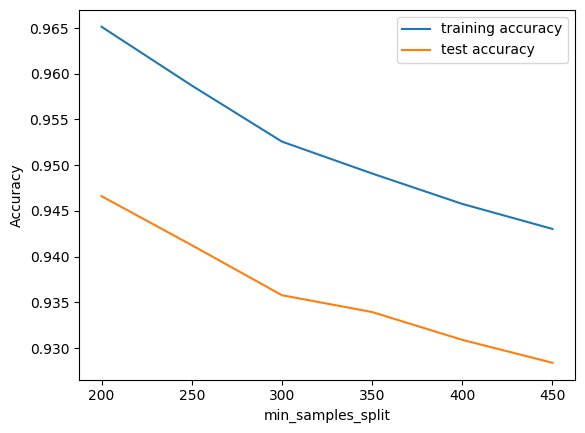

In [155]:
# plotting accuracies with min_samples_split
plt.figure()
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training accuracy")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test accuracy")
plt.xlabel("min_samples_split")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

200 to 250 is the best value

In [156]:
# Defining best value
min_samples_split = range(200, 250, 50)

#### Grid Search to find Optimal Hyperparameters

In [157]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'max_depth': max_depth,
    'min_samples_leaf': min_samples_leaf,
    'min_samples_split': min_samples_split,
    'n_estimators': n_estimators,
    'max_features': max_features
}

print(param_grid)

{'max_depth': range(12, 16), 'min_samples_leaf': range(100, 150, 50), 'min_samples_split': range(200, 250, 50), 'n_estimators': [300, 500], 'max_features': [6, 12]}


In [158]:
# Create a based model
RF_Best = RandomForestClassifier(class_weight='balanced',random_state=42)
# Instantiate the grid search model
grid_search_rfc = GridSearchCV(estimator = RF_Best, param_grid = param_grid, 
                               cv = 4, n_jobs = -1, verbose = 1, scoring='roc_auc')

In [159]:
# Fit the grid search to the data
grid_search_rfc.fit(PCA_train, y_train)

Fitting 4 folds for each of 16 candidates, totalling 64 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done  64 out of  64 | elapsed: 17.1min finished


GridSearchCV(cv=4, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight='balanced',
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False, random_state=42,
                            

In [160]:
# printing the optimal accuracy score and hyperparameters
print(f'Accuracy = {grid_search_rfc.best_score_}\n')
print('Best Params')
print(grid_search_rfc.best_params_)

Accuracy = 0.9391215128925977

Best Params
{'max_depth': 15, 'max_features': 6, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 500}


In [161]:
# Storing best parameters in a variable to use them later 
c=grid_search_rfc.best_params_
c=list(c.values())

# model with the best hyperparameters
RFC = RandomForestClassifier(class_weight='balanced',
                             bootstrap=True,
                             max_depth=c[0],
                             min_samples_leaf=c[2], 
                             min_samples_split=c[3],
                             max_features=c[1],
                             n_estimators=c[4])

In [162]:
# fit
RFC.fit(PCA_train,y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=15, max_features=6,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=100, min_samples_split=200,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [163]:
# predict
predictions = RFC.predict(PCA_test)

In [164]:
# Predict probablity
pred_probs_test1 = RFC.predict_proba(PCA_test)[:,1]
pred_probs_test1

array([0.11695337, 0.10757139, 0.35988517, ..., 0.21843763, 0.41088578,
       0.07311555])

In [165]:
# # Converting pred_probs_test to a dataframe which is an array
y_pred_df1 = pd.DataFrame(pred_probs_test1)

# Converting y_test to dataframe
y_test_df1 = pd.DataFrame(y_test)

# Removing index for both dataframes to append them side by side 
y_pred_df1.reset_index(drop=True, inplace=True)
y_test_df1.reset_index(drop=True, inplace=True)

# Appending y_test_df and y_pred_df
y_pred_final1 = pd.concat([y_test_df1,y_pred_df1],axis=1)

# Renaming the column 
y_pred_final1= y_pred_final1.rename(columns={ 0 : 'Churn_Prob'})

# Rearranging the columns
y_pred_final1 = y_pred_final1.reindex(['Churn','Churn_Prob'], axis=1)

y_pred_final1.head()

,Churn,Churn_Prob
0,0,0.116953
1,0,0.107571
2,0,0.359885
3,0,0.456306
4,0,0.220717


In [166]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_pred_final1[i]= y_pred_final1.Churn_Prob.map( lambda x: 1 if x > i else 0)
y_pred_final.head()

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.006316,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.053786,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.089935,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0.879535,1,1,1,1,1,1,1,1,1,1,0,1
4,0,0.049441,0,1,0,0,0,0,0,0,0,0,0,0


     probability  accuracy  sensitivity  specificity
0.0          0.0  0.081324     1.000000     0.000000
0.1          0.1  0.153316     0.995902     0.078728
0.2          0.2  0.457949     0.954918     0.413956
0.3          0.3  0.686813     0.887978     0.669005
0.4          0.4  0.816909     0.789617     0.819325
0.5          0.5  0.879569     0.710383     0.894546
0.6          0.6  0.908010     0.605191     0.934817
0.7          0.7  0.922564     0.468579     0.962752
0.8          0.8  0.926119     0.299180     0.981618
0.9          0.9  0.922897     0.096995     0.996009


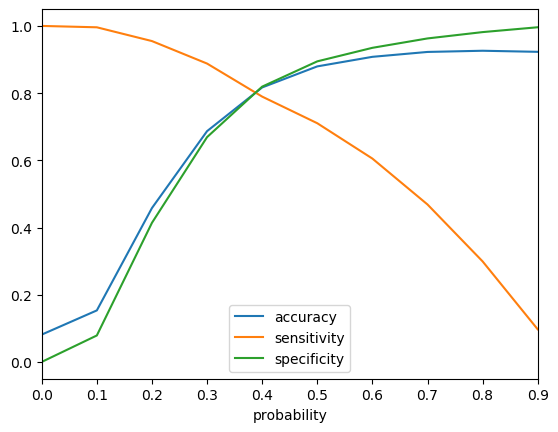

In [167]:
# Accuracy,Sensitivity and Specificity at various probability cutoffs
probability_cutoffs( y_pred_final1.Churn, y_pred_final1 )

In [168]:
# # Predicting values at best threshold value
y_pred_final1['final_predicted'] = y_pred_final1.Churn_Prob.map( lambda x: 1 if x > 0.5 else 0)
y_pred_final.head(5)

,Churn,Churn_Prob,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.006316,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.053786,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.089935,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0.879535,1,1,1,1,1,1,1,1,1,1,0,1
4,0,0.049441,0,1,0,0,0,0,0,0,0,0,0,0


Confusion matrix
[[7397  872]
 [ 212  520]]

Overall accuracy =  0.8795689367848016
True positive = 520, true negatives = 7397, false positives = 872, false negatives = 212

Sensitivity =  0.7103825136612022
specificity =  0.8945458943040271

False postive rate =  0.10545410569597291
positive predictive value =  0.3735632183908046
Negative predictive value =  0.9721382573268498
              precision    recall  f1-score   support

           0       0.97      0.89      0.93      8269
           1       0.37      0.71      0.49       732

    accuracy                           0.88      9001
   macro avg       0.67      0.80      0.71      9001
weighted avg       0.92      0.88      0.90      9001



------ 

### Random Forest with PCA after tuning  Model Stats Scores Summary : 

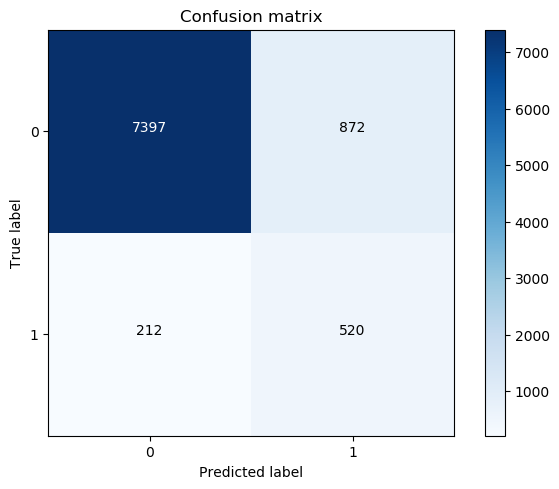

,Model,Accuracy,Precision,Recall,AUC,F1
0,Random Forest with PCA after tuning,0.88,0.37,0.71,0.8,0.49


In [169]:
# Printing the metrics using user defined function
compute_and_print_metrics_from_confusion_matrix(y_test, predictions)
print(classification_report(y_test, predictions))
print_model_metrics(y_test, predictions,"Random Forest with PCA after tuning ")

In [170]:
# Mean
np.mean(y_test-predictions)

-0.0733251860904344

Inference for Random Forest with PCA
- With Random Forest using PCA we are getting a model with ~88 %accuracy and 71% Senstivity/Recall which is low as compared to Logistic Regression model earlier.

### Model 4 

### SVM with PCA

In [171]:
from sklearn.svm import SVC
# using rbf kernel, C=1, default value of gamma
model = SVC(C = 1,class_weight='balanced', kernel='rbf',random_state=42)
model.fit(PCA_train, y_train)

y_pred_svc = model.predict(PCA_test)

Confusion matrix
[[7502  767]
 [ 191  541]]

Overall accuracy =  0.8935673814020665
True positive = 541, true negatives = 7502, false positives = 767, false negatives = 191

Sensitivity =  0.7390710382513661
specificity =  0.9072439230862257

False postive rate =  0.09275607691377434
positive predictive value =  0.4136085626911315
Negative predictive value =  0.9751722344988951
              precision    recall  f1-score   support

           0       0.98      0.91      0.94      8269
           1       0.41      0.74      0.53       732

    accuracy                           0.89      9001
   macro avg       0.69      0.82      0.74      9001
weighted avg       0.93      0.89      0.91      9001



------ 

### SVM with PCA  Model Stats Scores Summary : 

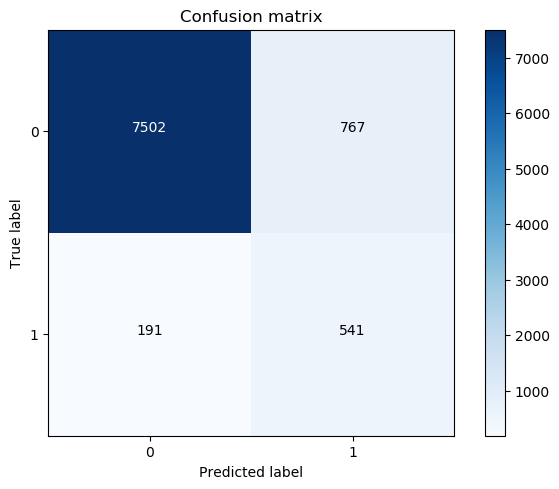

,Model,Accuracy,Precision,Recall,AUC,F1
0,SVM with PCA,0.89,0.41,0.74,0.82,0.53


In [172]:
# Printing metrics using user defined function
compute_and_print_metrics_from_confusion_matrix(y_test, y_pred_svc)
print(classification_report(y_test, y_pred_svc))
print_model_metrics(y_test, y_pred_svc,"SVM with PCA ")

In [173]:
# creating a KFold object with 4 splits 
folds = KFold(n_splits = 4, shuffle = True, random_state = 42)

# specify range of hyperparameters
# Set the parameters by cross-validation
hyper_params = [ {'gamma': [1e-2, 1e-3, 1e-4],
                     'C': [1, 10, 100, 1000]}]


# specify model
model = SVC(kernel="rbf",class_weight='balanced', random_state=42)

# set up GridSearchCV()
model_cv = GridSearchCV(estimator = model, 
                        param_grid = hyper_params, 
                        scoring='recall',
                        cv = folds,
                        n_jobs = -1,
                        verbose = 1,
                        return_train_score=True)      

# fit the model
model_cv.fit(PCA_train, y_train)

Fitting 4 folds for each of 12 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed: 22.6min finished


GridSearchCV(cv=KFold(n_splits=4, random_state=42, shuffle=True),
             error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight='balanced', coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=42, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=-1,
             param_grid=[{'C': [1, 10, 100, 1000],
                          'gamma': [0.01, 0.001, 0.0001]}],
             pre_dispatch='2*n_jobs', refit=True, return_train_score=True,
             scoring='recall', verbose=1)

In [174]:
# cv results
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,mean_train_score,std_train_score
0,84.393442,7.139590,12.061198,0.102266,1,0.01,"{'C': 1, 'gamma': 0.01}",0.935244,0.943243,0.935871,0.938516,0.938219,0.003150,5,0.948276,0.947517,0.945355,0.947492,0.947160,0.001089
1,99.989357,3.813110,16.351602,0.198805,1,0.001,"{'C': 1, 'gamma': 0.001}",0.865539,0.872141,0.866984,0.863485,0.867037,0.003198,10,0.868785,0.869139,0.868507,0.866556,0.868247,0.001001
2,120.294726,2.801414,20.515467,1.970990,1,0.0001,"{'C': 1, 'gamma': 0.0001}",0.840586,0.843867,0.840712,0.833472,0.839659,0.003806,12,0.839634,0.838823,0.841253,0.839095,0.839701,0.000942
3,98.234233,3.507157,8.824851,0.535178,10,0.01,"{'C': 10, 'gamma': 0.01}",0.983708,0.988565,0.984485,0.986453,0.985803,0.001883,3,0.991414,0.991437,0.990731,0.992341,0.991481,0.000572
4,89.899516,4.932054,14.273254,0.192837,10,0.001,"{'C': 10, 'gamma': 0.001}",0.899154,0.901663,0.900290,0.898499,0.899902,0.001202,8,0.903753,0.904426,0.903991,0.901470,0.903410,0.001146
5,100.590468,3.740701,16.957107,0.462517,10,0.0001,"{'C': 10, 'gamma': 0.0001}",0.852341,0.854262,0.848366,0.847853,0.850705,0.002689,11,0.852444,0.852634,0.853773,0.852274,0.852781,0.000587
6,190.923232,18.817044,9.309819,0.060906,100,0.01,"{'C': 100, 'gamma': 0.01}",0.994638,0.996674,0.996690,0.996040,0.996010,0.000835,1,0.999515,0.999517,0.999862,0.999862,0.999689,0.000173
7,127.981002,10.640946,16.747478,0.072482,100,0.001,"{'C': 100, 'gamma': 0.001}",0.936894,0.940125,0.936078,0.937891,0.937747,0.001516,6,0.946891,0.945584,0.942173,0.944939,0.944897,0.001722
8,131.173574,8.358216,22.497634,0.532240,100,0.0001,"{'C': 100, 'gamma': 0.0001}",0.866158,0.874220,0.867604,0.867445,0.868857,0.003147,9,0.870655,0.870865,0.869959,0.868419,0.869975,0.000959
9,341.474014,4.349694,7.233027,0.120134,1000,0.01,"{'C': 1000, 'gamma': 0.01}",0.992370,0.993347,0.995656,0.994581,0.993988,0.001241,2,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000


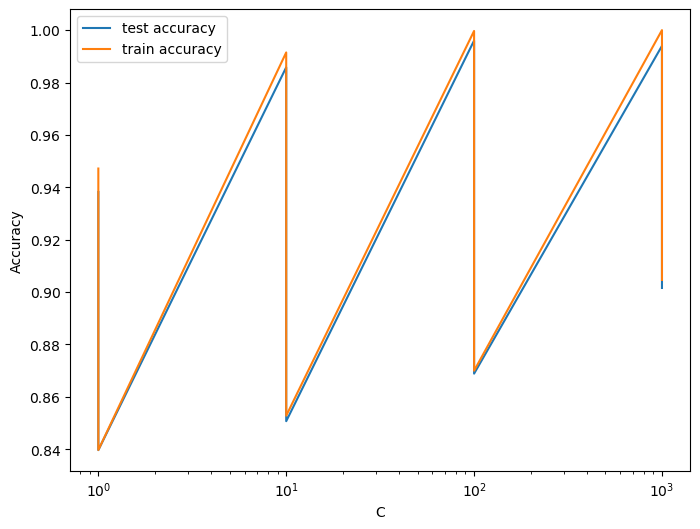

In [175]:
# plot of C versus train and test scores

plt.figure(figsize=(8, 6))
plt.plot(cv_results['param_C'], cv_results['mean_test_score'])
plt.plot(cv_results['param_C'], cv_results['mean_train_score'])
plt.xlabel('C')
plt.ylabel('Accuracy')
plt.legend(['test accuracy', 'train accuracy'], loc='upper left')
plt.xscale('log')

In [176]:
# printing the optimal accuracy score and hyperparameters
best_score = model_cv.best_score_
best_hyperparams = model_cv.best_params_

print("The best test score is {0} corresponding to hyperparameters {1}".format(best_score, best_hyperparams))

The best test score is 0.9960104486902586 corresponding to hyperparameters {'C': 100, 'gamma': 0.01}


In [177]:
# specify optimal hyperparameters and model
model = SVC(C=100, class_weight='balanced',gamma=0.01,kernel="rbf", random_state=42)

model.fit(PCA_train, y_train)
y_pred_svc = model.predict(PCA_test)

Confusion matrix
[[7699  570]
 [ 314  418]]

Overall accuracy =  0.9017886901455394
True positive = 418, true negatives = 7699, false positives = 570, false negatives = 314

Sensitivity =  0.5710382513661202
specificity =  0.9310678437537792

False postive rate =  0.06893215624622083
positive predictive value =  0.4230769230769231
Negative predictive value =  0.9608136777736179
              precision    recall  f1-score   support

           0       0.96      0.93      0.95      8269
           1       0.42      0.57      0.49       732

    accuracy                           0.90      9001
   macro avg       0.69      0.75      0.72      9001
weighted avg       0.92      0.90      0.91      9001

precision =  0.4230769230769231


------ 

### SVM with PCA and tuning  Model Stats Scores Summary : 

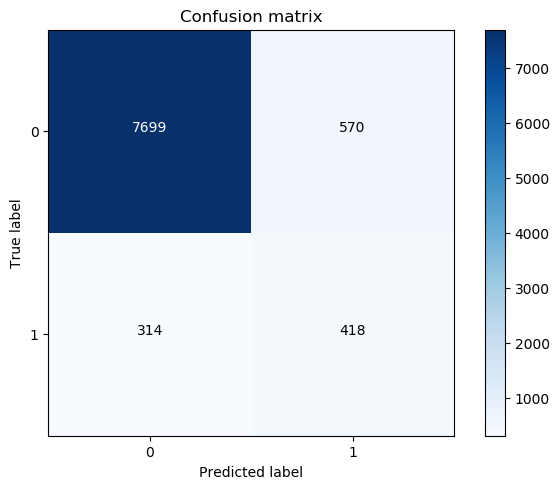

,Model,Accuracy,Precision,Recall,AUC,F1
0,SVM with PCA and tuning,0.9,0.42,0.57,0.75,0.49


In [178]:
# metrics
compute_and_print_metrics_from_confusion_matrix(y_test, y_pred_svc)
print(classification_report(y_test, y_pred_svc))
print("precision = ", metrics.precision_score(y_test, y_pred_svc))
print_model_metrics(y_test, y_pred_svc,"SVM with PCA and tuning ")

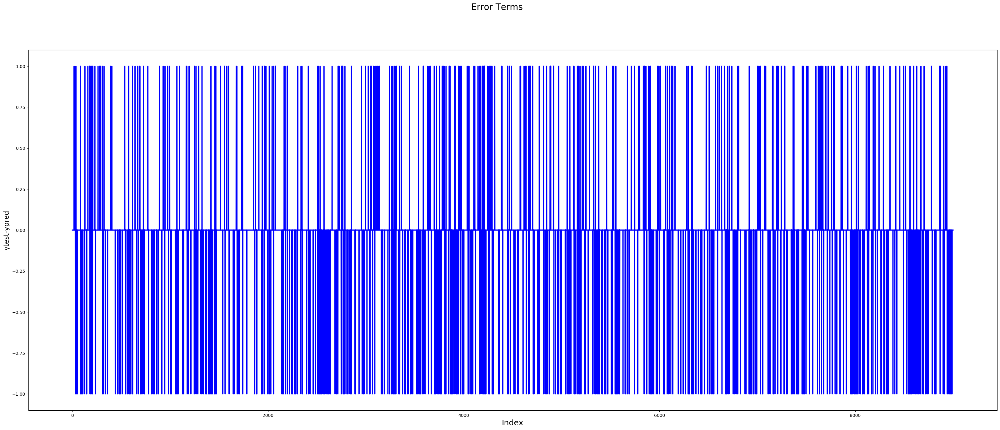

In [179]:
# Error terms
c = [i for i in range(len(y_pred_svc))]
fig = plt.figure(figsize=(40, 15))
plt.plot(c, y_test-y_pred_svc, color="blue", linewidth=2.5, linestyle="-")
fig.suptitle('Error Terms', fontsize=20)              # Plot heading 
plt.xlabel('Index', fontsize=18)                      # X-label
plt.ylabel('ytest-ypred', fontsize=16)                # Y-label
plt.show()

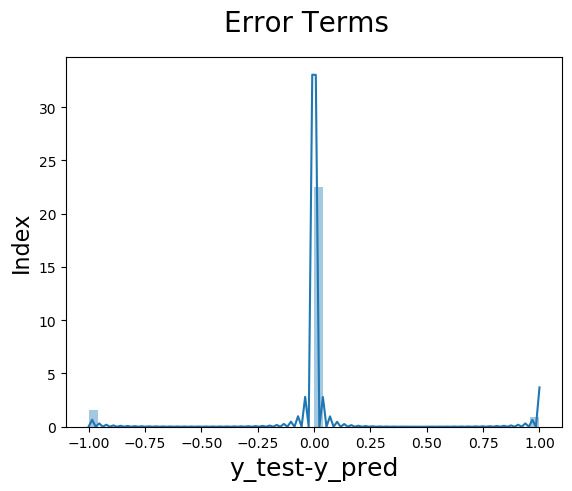

In [180]:
# Plotting the error terms to understand the distribution.
fig = plt.figure()
sns.distplot((y_test-y_pred_svc),bins=50)
fig.suptitle('Error Terms', fontsize=20)                  # Plot heading 
plt.xlabel('y_test-y_pred', fontsize=18)                  # X-label
plt.ylabel('Index', fontsize=16)                          # Y-label
plt.show()

Inference from SVM with PCA¶
 - without tuning : accuracy 89% and sensitivity 74%


### Model 5

### Random forest without PCA to understand the top features

In [181]:
# random forest - the class weight is used to handle class imbalance - it adjusts the cost function
forest = RandomForestClassifier(class_weight={0:0.1, 1: 0.9}, n_jobs = -1)

# hyperparameter space
params = {"criterion": ['gini', 'entropy'], "max_features": ['auto', 0.4]}

# create 5 folds
folds = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 4)

# create gridsearch object
model = GridSearchCV(estimator=forest, cv=folds, param_grid=params, scoring='recall', n_jobs=-1, verbose=1)

In [182]:
# fit model
model.fit(X_train, y_train)

# print best hyperparameters
print("Best AUC: ", model.best_score_)
print("Best hyperparameters: ", model.best_params_)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:  6.1min finished


Best AUC:  0.9730447335448591
Best hyperparameters:  {'criterion': 'entropy', 'max_features': 'auto'}


[[7954  315]
 [ 273  459]]
              precision    recall  f1-score   support

           0       0.97      0.96      0.96      8269
           1       0.59      0.63      0.61       732

    accuracy                           0.93      9001
   macro avg       0.78      0.79      0.79      9001
weighted avg       0.94      0.93      0.94      9001

Confusion matrix
[[7954  315]
 [ 273  459]]

Overall accuracy =  0.9346739251194311
True positive = 459, true negatives = 7954, false positives = 315, false negatives = 273

Sensitivity =  0.6270491803278688
specificity =  0.9619059136534043

False postive rate =  0.03809408634659572
positive predictive value =  0.5930232558139535
Negative predictive value =  0.9668165795551233


------ 

### Random Forest without PCA  Model Stats Scores Summary : 

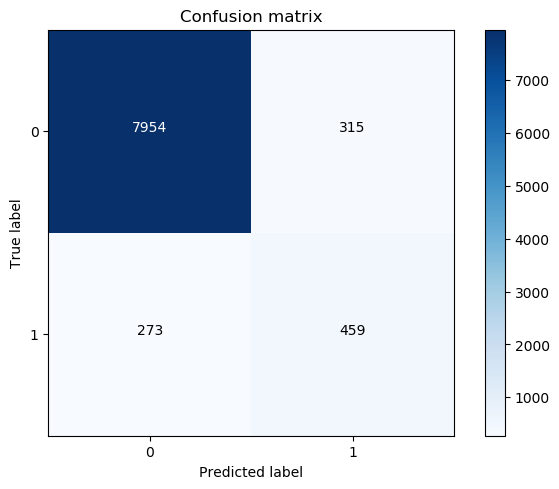

,Model,Accuracy,Precision,Recall,AUC,F1
0,Random Forest without PCA,0.93,0.59,0.63,0.79,0.61


In [183]:
# predict churn on test data
y_pred = model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
print(classification_report(y_test, y_pred))
compute_and_print_metrics_from_confusion_matrix(y_test, y_pred)

# check area under curve
y_pred_prob = model.predict_proba(X_test)[:, 1]
print_model_metrics(y_test, y_pred,"Random Forest without PCA ")

In [184]:
# run a random forest model on train data
max_features = int(round(np.sqrt(X_train.shape[1])))    # number of variables to consider to split each node
print(max_features)

rf_model = RandomForestClassifier(n_estimators=100, max_features=max_features, class_weight={0:0.1, 1: 0.9}, oob_score=True, random_state=4, verbose=1)

9


In [185]:
# fit model
rf_model.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   56.5s finished


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight={0: 0.1, 1: 0.9}, criterion='gini',
                       max_depth=None, max_features=9, max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0,
                       min_impurity_split=None, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=None, oob_score=True,
                       random_state=4, verbose=1, warm_start=False)

In [186]:
# OOB score
rf_model.oob_score_

0.9637654864962936

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[[7950  319]
 [ 289  443]]


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished


------ 

### Random Forest without PCA and after Tuning  Model Stats Scores Summary : 

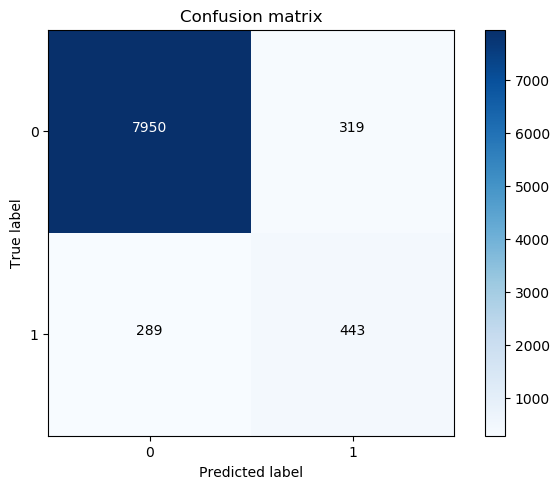

,Model,Accuracy,Precision,Recall,AUC,F1
0,Random Forest without PCA and after Tuning,0.93,0.58,0.61,0.78,0.59


In [187]:
# predict churn on test data
y_pred = rf_model.predict(X_test)

# create onfusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

# check sensitivity and specificity
# compute_and_print_metrics_from_confusion_matrix(y_test, y_pred)

# check area under curve
y_pred_prob = rf_model.predict_proba(X_test)[:, 1]
print_model_metrics(y_test, y_pred,"Random Forest without PCA and after Tuning ")

#### Feature Importance

In [188]:
# predictors
features = Telecom_Df_HV.drop('Churn', axis=1).columns

# feature_importance
importance = rf_model.feature_importances_

# create dataframe
feature_importance = pd.DataFrame({'variables': features, 'importance_percentage': importance*100})
feature_importance = feature_importance[['variables', 'importance_percentage']]

# sort features
feature_importance = feature_importance.sort_values('importance_percentage', ascending=False).reset_index(drop=True)
print("Sum of importance=", feature_importance.importance_percentage.sum())
feature_importance

Sum of importance= 100.0


,variables,importance_percentage
0,roam_og_mou_8,8.053822
1,roam_ic_mou_8,7.343961
2,total_rech_amt_8,4.604368
3,loc_og_t2m_mou_8,3.784310
4,av_rech_amt_data_8,3.763372
5,loc_ic_t2m_mou_8,3.670880
6,total_rech_data_8,3.170388
7,arpu_8,2.920029
8,max_rech_amt_8,2.460251
9,loc_ic_t2t_mou_8,2.033847


#### Top 10 features

In [189]:
# extract top 'n' features
top_n = 10
top_features = feature_importance.variables[0:top_n]

In [190]:
top_features

0         roam_og_mou_8
1         roam_ic_mou_8
2      total_rech_amt_8
3      loc_og_t2m_mou_8
4    av_rech_amt_data_8
5      loc_ic_t2m_mou_8
6     total_rech_data_8
7                arpu_8
8        max_rech_amt_8
9      loc_ic_t2t_mou_8
Name: variables, dtype: object

In [191]:
consolidate_summary.head(10)

,Model,Accuracy,Precision,Recall,AUC,F1
0,Logistic with PCA,0.83,0.30,0.80,0.82,0.44
1,Logistic With PCA,0.83,0.30,0.80,0.82,0.44
2,Decision Tree with PCA,0.80,0.25,0.72,0.76,0.37
3,Decision Tree with PCA after tuning,0.82,0.27,0.70,0.76,0.39
4,Decision Tree with PCA using Bagging,0.83,0.29,0.73,0.79,0.41
5,Random Forest with PCA,0.92,0.50,0.54,0.75,0.52
6,Random Forest with PCA after tuning,0.88,0.37,0.71,0.80,0.49
7,SVM with PCA,0.89,0.41,0.74,0.82,0.53
8,SVM with PCA and tuning,0.90,0.42,0.57,0.75,0.49
9,Random Forest without PCA,0.93,0.59,0.63,0.79,0.61


### Insight:
- Logistic with PCA has higher accuracy and Recall values

### Analysis

By analysing the top 10 features below are the factors which influence the churn:
- People who are on roaming are having higher chance of churn (roam_og_mou, roam_ic_mou)
- Lower amount of total recharge has higher chance of churn (total_rech_amt)
- Outgoing and incoming calls to other networks has higher chance of churn (loc_og_t2m_mou,loc_ic_t2m_mou)
- Lower amount of recharge data has higher chance of churn(av_rech_amt_data)
- Customer withlLow average revenue per month has high chance of churn(arpu)

### Recomendation

To reduce Churn:
- Keep the roaming rates lower
- Keep the tariff for offnet callers low
- Discount recharge packages or offers may help in customer retention
- Offer more services for low arpu customers

Talk to the identified churn customers take their feedback and act accordingly



